In [378]:
import pandas as pd
pd.options.plotting.backend = "plotly"
pd.set_option('display.max_rows',1000)
import cv2
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import os
import numpy as np
import statistics
from datetime import datetime as dt
from scipy.stats.mstats import winsorize
import seaborn as sns
import plotly.express as px
from scipy.spatial import distance

from enum import Enum
class pred_path(Enum):
    ETH = "Models/ETH-XGaze-master/ETH-XGaze-master/Subjects/"
    MPII = "Models/pytorch_mpiigaze-master/Subjects/"
    FAZE = "Models/FAZE/few_shot_gaze/demo/Subjects/"
    EAR = "Models/blink_Soukuova_and_Check/Subjects/"
    RT_BENE = "Models/rt_gene-master/rt_gene-master/rt_bene_standalone/Subjects/"

In [360]:
#utils
import ffmpeg    
import imutils

def get_dist(p1,p2):
    return math.sqrt((p1[0]-p2[0])**2+(p1[1]-p2[1])**2)

def fu_to_deg(size):
    return size/54.05

def get_frame_count(fname):
    vid = cv2.VideoCapture(fname)
    c=0
    while True:
        ret = vid.grab()
        if not ret:
            break
        c+=1
    return c

def time_to_frame(l, fname):
    c = get_frame_count(fname)
    vid_len = ffmpeg.probe(fname)["format"]["duration"]  ## using ffprobe, can also use RecStop-RecStart but ffprobe should be better for fps calc
    vid_len = float(vid_len)*1000
    frame_nos = []

    for pt in l:
        frame_nos.append(int(c*(float(pt)/vid_len)))
    return frame_nos

def get_dist(p1,p2):
    return math.sqrt((p1[0]-p2[0])**2+(p1[1]-p2[1])**2)

def fu_to_deg(size):
    return size/54.05

## Participant data analysis (skip for task analysis)

In [107]:
subb = '11' 

df = pd.read_csv("Subjects/s"+subb+"/data.csv")
Task_seq = eval(df.Block_Name.max().strip("tasks ()"))
Task_seq

(1, 2, 5, 3, 4)

In [ ]:
# df[["Block_Name", "Task_Name", "Trial_Id"]].iloc[::-1]
# s4 : smooth pursuit calibration comparison
# s5 : complete procedure single trials
# s6 : Aman
# s7 : 4:3 frame size -> did not work
# s8 : Joshua's pilot exp
# s9 : Dogra's pilot exp
# s10 : Leonie's pilot exp
# s11 : Camila's pilot exp

In [122]:
for i in fix_analyse.df[fix_analyse.df["Task_Name"] == "5. Blink Detect"].BlinkRec:
    print(i)

blockNr_13_taskNr_12_trialNr_1_BlinkRec.webm
blockNr_13_taskNr_12_trialNr_2_BlinkRec.webm
blockNr_13_taskNr_12_trialNr_3_BlinkRec.webm
blockNr_13_taskNr_12_trialNr_4_BlinkRec.webm
blockNr_13_taskNr_12_trialNr_5_BlinkRec.webm
blockNr_6_taskNr_12_trialNr_1_BlinkRec.webm
blockNr_6_taskNr_12_trialNr_2_BlinkRec.webm
blockNr_6_taskNr_12_trialNr_3_BlinkRec.webm
blockNr_6_taskNr_12_trialNr_4_BlinkRec.webm
blockNr_6_taskNr_12_trialNr_5_BlinkRec.webm


In [112]:
def get_time(row):
    format = '%Y-%m-%dT%H:%M:%S.000Z'
    start = dt.strptime(row["start_time"],format)
    end = dt.strptime(row["end_time"],format)
    duration = end-start
    return duration, row["completed"]

row = df[df["Task_Name"] == "instructions"].iloc[0].dropna()
duration,_ = get_time(row)
seconds = duration.total_seconds()
hours = seconds // 3600
minutes = (seconds % 3600) // 60
seconds = seconds % 60
print(hours,"hours",minutes,"minutes",seconds,"seconds")
row.dropna()[6:]

0.0 hours 43.0 minutes 19.0 seconds


check_faceLit                                                            True
check_faceLitFront                                                       True
check_noLightBehind                                                      True
check_noMask                                                             True
Condition_Id                                                                1
FieldOfStudy                                                         option_1
freeview_seq                "times=1631041885996;1631042079064---values=1,...
GenderChoice                                                         option_0
IsAStudent                                                           option_0
Level1                                                                  False
Level2                                                                   True
Level3                                                                   True
VisionChoice                                                    

In [113]:
df.iloc[0].dropna()[8:15]

Form_Filled                                                            False
Form_Submit_Time                                             1631044484104.0
German_form                <a href="https://survey.academiccloud.de/index...
vol_party                                                               True
voluntary_participation                                                False
agent_spec                 Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7...
always_fullscreen                                                      False
Name: 0, dtype: object

In [71]:
# fix_analyse.df.did_leave_fullscreen
# fix_analyse.df.

In [162]:
for i in range(1,11):
    try:
        temp = pd.read_csv("Subjects/s{}/data.csv".format(i))
        duration,completed = get_time(temp)
        seconds = duration.total_seconds()
        hours = seconds // 3600
        minutes = (seconds % 3600) // 60
        seconds = seconds % 60
        print("Subject", i, ": completed", completed , hours,"hours",minutes,"minutes",seconds,"seconds")
    except:
#         print(i, "error")
        pass

Subject 5 : completed yes 0.0 hours 19.0 minutes 28.0 seconds
Subject 6 : completed yes 1.0 hours 46.0 minutes 34.0 seconds
Subject 8 : completed yes 0.0 hours 48.0 minutes 22.0 seconds
Subject 9 : completed yes 1.0 hours 39.0 minutes 0.0 seconds
Subject 10 : completed yes 0.0 hours 38.0 minutes 51.0 seconds


# Fixation

In [241]:
import ffmpeg    
import math



def plot_trials(pts, trial_x, trial_y, xlim=1600 ,ylim=900  , figsize=(18,9), n=14):
    fig,ax = plt.subplots(figsize=figsize)
    
    pallete = iter(cm.rainbow(np.linspace(0, 1, n)))
    for i in range(n):
        pt = pts[i]
        c = next(pallete)
    #     X = winsorize(mean_x[i], limits=[0.1,0.1])
    #     Y = winsorize(mean_y[i], limits=[0.1,0.1])
        X = statistics.median(trial_x[i])
        Y = statistics.median(trial_y[i])
        ax.plot(X,Y,marker = ".", markersize = 30, color = c)
        ax.plot(pt[0],pt[1],marker="+", markersize = 15, color = c)

    ax.set_xlim(0,xlim)
    ax.set_ylim(0,ylim)
    return ax

class Fixation():
    def __init__(self, subb, pre, calib_block, show=True):
        
        self.gt_points = [(800,450),(200,112),(800,112),(1400,112),(200,448),(1400,448),(200,784),(800,784),(1400,784),(600,336),(600,560),(1000,336),(1000,560),(800,500)]
        self.subb = subb
        self.pre = pre
        self.calib_block = calib_block
        self.df = pd.read_csv("Subjects/s"+subb+"/data.csv")
        self.fix_df = self.df[self.df["Task_Name"] == "1. Fixation"]
        self.palette = cm.rainbow(np.linspace(0, 1, 14))
        if show:
            print("fix_df summary \n {}".format(self.summary()))

    def summary(self):
        print(self.fix_df.iloc[0].dropna()[8:17])
    
    def parse_trials(self, model, show = True, model_outputs = False):
        
        trial_x = {key:[] for key in range(14)}
        trial_y = {key:[] for key in range(14)}
        for _,row in self.fix_df.iterrows():
    
            fix_seq = [0] + [int(i) for i in row.fix_seq.split(";")] + [13]

            fixRec = row.FixRec
            rec_id = row.rec_session_id
            fname = "Subjects/s{}/{}/{}".format(self.subb,rec_id,fixRec)

            time_pts = row.time_pts.split("---values=")[1].strip("\"").split(";")
            time_pts = [int(t) - int(row.RecStart) for t in time_pts if len(t)>1]
            
            posChange = row.positionChange.split("---values=")[1].strip("\"").split(";")
            posChange = [int(t) - int(row.RecStart) for t in posChange if len(t)>1]

            if show:
                vid_len = ffmpeg.probe(fname)["format"]["duration"]
                print("Recording length : ",vid_len)
                print("RecStop - RecStart : ",row.RecStop - row.RecStart)
                c = get_frame_count(fname)
                print("Frame Count : ",c)
                print("FPS : ",c/float(vid_len))
                print("key press times : ",time_pts)
                print("position update times : ",posChange)
                print("diff : ", [int(i)-int(j) for i,j in zip(posChange,time_pts)])
                
            if model_outputs:
                pred_df = pd.read_csv(os.path.join(model.value, "s{}/model_outputs/Block_{}".format(subb,str(row.Block_Nr)),"Fixation{}.csv".format(row.Trial_Id)))
            else:
                if model.name == "FAZE":
                    pred_df = pd.read_csv(os.path.join(model.value, "s{}/pix_to_fu/Block_{}/Fixation{}.csv".format(self.subb,str(row.Block_Nr),row.Trial_Id)))
                else:
                    pred_df = pd.read_csv(os.path.join(model.value, "s{}/pix_to_fu/{}_preds/{}/Block_{}/Fixation{}.csv".format(self.subb,self.pre,self.calib_block,str(row.Block_Nr),row.Trial_Id)))
            
            l = [(int(j),int(i)) for i,j in zip(time_to_frame(posChange, fname),time_to_frame(time_pts, fname))]
            for index,pt in enumerate(l):
#                 sub = pred_df.iloc[pt[0]:pt[1]]
                sub = pred_df[pred_df.frame.between(pt[0],pt[1])]  #update in other tasks as well
                print(sub.shape)
                
#                 X = winsorize(sub.poly_x, limits=[0.1,0.1])
#                 Y = winsorize(sub.poly_y, limits=[0.1,0.1])

                trial_x[fix_seq[index]].append(round(statistics.median(sub.poly_x),2))
                trial_y[fix_seq[index]].append(round(statistics.median(sub.poly_y),2))
                
                if show: 
                    plt.scatter(sub.poly_x,sub.poly_y, color = self.palette[fix_seq[index]])
            if show:
                plt.gca().invert_yaxis()
                plt.show()
                print("-"*50)
        return trial_x,trial_y

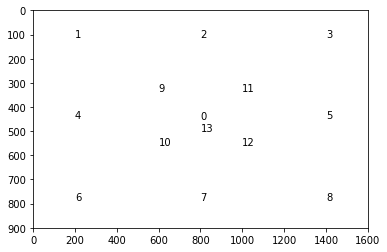

In [4]:
pts = [(800,450),(200,112),(800,112),(1400,112),(200,448),(1400,448),(200,784),(800,784),(1400,784),(600,336),(600,560),(1000,336),(1000,560),(800,500)]
# plt.figure(figsize=(18,9))
# color = cm.rainbow(np.linspace(0, 1, 14))
plt.xlim(0,1600)
plt.ylim(0,900)
for i,pt in enumerate(pts):
    plt.text(pt[0],pt[1],str(i))
plt.gca().invert_yaxis()

In [242]:
fix_analyse = Fixation("11","E","Beg", show = False)

### test

In [283]:
##Test
for i in range(1,6):
    path = "Models/ETH-XGaze-master/ETH-XGaze-master/Subjects/s{}/model_outputs/Block_6".format(subb)
    temp = pd.read_csv(os.path.join(path,"Fixation{}.csv".format(i)))
    print(temp.shape)

(1867, 4)
(1907, 4)
(2223, 4)
(2222, 4)
(1858, 4)


In [ ]:
##Test
for i in os.listdir("Subjects/s8/301355"):
    if "FixRec" in i:
        print(get_frame_count("Subjects/s8/301355/"+i),i)

1858 blockNr_6_taskNr_12_trialNr_3_FixRec.webm
1639 blockNr_13_taskNr_12_trialNr_4_FixRec.webm
2184 blockNr_6_taskNr_11_trialNr_1_FixRec.webm
1585 blockNr_13_taskNr_12_trialNr_2_FixRec.webm
1867 blockNr_6_taskNr_12_trialNr_5_FixRec.webm
1615 blockNr_13_taskNr_12_trialNr_5_FixRec.webm
1907 blockNr_6_taskNr_12_trialNr_1_FixRec.webm
1593 blockNr_13_taskNr_12_trialNr_1_FixRec.webm
2222 blockNr_6_taskNr_12_trialNr_2_FixRec.webm
2223 blockNr_6_taskNr_12_trialNr_4_FixRec.webm
1553 blockNr_13_taskNr_12_trialNr_3_FixRec.webm


In [ ]:
##Test
##for visualizing gazepoints in time
from IPython.display import display, clear_output
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1) 
temp = time_to_frame(time_pts, fname)
color = cm.rainbow(np.linspace(0, 1, 14))
counter = 0
for i,row in pred_df.iterrows():
    ax.set_xlim(0, pred_df.X.max())
    ax.set_ylim(0, pred_df.Y.max())    
#     ax.cla()
    if i > temp[counter]:
        counter+=1
    ax.plot(row.X, row.Y,marker='x', color = color[counter])
    display(fig)
    
    clear_output(wait = True)

In [ ]:
fix_df = df[df["Task_Name"] == "1. Fixation"]
fix_df.iloc[0].dropna()[8:17]

In [ ]:
subb = "8"
pre = "E"
calib_block = "Beg"
df = pd.read_csv("Subjects/s"+subb+"/data.csv")
fix_df = df[df["Task_Name"] == "1. Fixation"]
mean_x = {key:[] for key in range(14)}
mean_y = {key:[] for key in range(14)}
color = cm.rainbow(np.linspace(0, 1, 14))
for i in fix_df.index:
    
    row = fix_df.loc[i]
    fix_seq = [0] + [int(i) for i in row.fix_seq.split(";")] + [13]
    
    fixRec = row.FixRec
    rec_id = row.rec_session_id
    fname = "Subjects/s"+str(subb)+"/"+str(rec_id)+"/"+fixRec
    vid_len = ffmpeg.probe(fname)["format"]["duration"]
    print("Recording length : ",vid_len)
    print("RecStop - RecStart : ",row.RecStop - row.RecStart)
    c = get_frame_count(fname)
    print("Frame Count : ",c)
    print("FPS : ",c/float(vid_len))
    
    time_pts = row.time_pts.split("---values=")[1].strip("\"").split(";")
    time_pts = [int(t) - int(row.RecStart) for t in time_pts if len(t)>1]
    print("key press times : ",time_pts)
    posChange = row.positionChange.split("---values=")[1].strip("\"").split(";")
    posChange = [int(t) - int(row.RecStart) for t in posChange if len(t)>1]
    print("position update times : ",posChange)
    print("diff : ", [int(i)-int(j) for i,j in zip(posChange,time_pts)])
    
    path = "Models/ETH-XGaze-master/ETH-XGaze-master/Subjects/s{}/pix_to_fu/{}_preds/{}/Block_{}".format(subb,pre,calib_block,str(row.Block_Nr))
    pred_df = pd.read_csv(os.path.join(path,"Fixation{}.csv".format(row.Trial_Id)))
#     pred_df = pd.read_csv(os.path.join("Models/ETH-XGaze-master/ETH-XGaze-master/Subjects/s{}/model_outputs/Block_{}".format(subb,str(row.Block_Nr)),"Fixation{}.csv".format(row.Trial_Id)))
    l = [(int(j),int(i)) for i,j in zip(time_to_frame(posChange, fname),time_to_frame(time_pts, fname))]
#     print("Var  {:<6} {:<6} {:<6} {:<6} {:<6}".format('Min','Max','Range','Std','Mean'))
    
    
    for index,pt in enumerate(l):
        sub = pred_df.iloc[pt[0]:pt[1]]
        X = winsorize(sub.poly_x, limits=[0.1,0.1])
        Y = winsorize(sub.poly_y, limits=[0.1,0.1])
        
        mean_x[fix_seq[index]].append(round(statistics.median(sub.poly_x),2))
        mean_y[fix_seq[index]].append(round(statistics.median(sub.poly_y),2))
        
        plt.scatter(X,Y, color = color[fix_seq[index]])
#         print("X:   {:<6} {:<6} {:<6} {:<6} {:<6}".format(sub.poly_x.min(), sub.poly_x.max(), sub.poly_x.max()-sub.poly_x.min(), round(sub.poly_x.std(),2), round(sub.poly_x.mean(),2)))
#         print("Y:   {:<6} {:<6} {:<6} {:<6} {:<6}".format(sub.poly_y.min(), sub.poly_y.max(), sub.poly_y.max()-sub.poly_y.min(), round(sub.poly_y.std(),2), round(sub.poly_y.mean(),2)))
    plt.gca().invert_yaxis()
    plt.show()
    print("-"*50)

## MPIIGaze

Recording length :  49.015000
RecStop - RecStart :  49063.0
Frame Count :  1470
FPS :  29.990819136998876
key press times :  [1079, 4745, 8332, 11782, 15232, 18787, 22353, 25794, 29204, 32734, 36171, 39567, 43090, 46555]
position update times :  [3588, 7255, 10837, 14287, 17736, 21304, 24870, 28303, 31722, 35252, 38682, 42083, 45600, 49064]
diff :  [2509, 2510, 2505, 2505, 2504, 2517, 2517, 2509, 2518, 2518, 2511, 2516, 2510, 2509]
(76, 8)
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(74, 8)


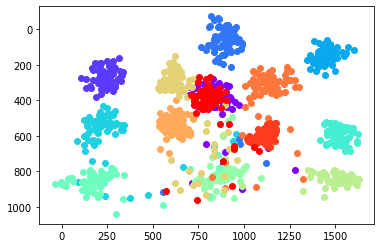

--------------------------------------------------
Recording length :  48.652000
RecStop - RecStart :  48723.0
Frame Count :  1448
FPS :  29.76239414618104
key press times :  [1025, 4421, 7942, 11424, 15050, 18660, 22174, 25690, 29283, 32797, 36289, 39526, 42777, 46214]
position update times :  [3528, 6922, 10457, 13941, 17555, 21170, 24686, 28201, 31803, 35303, 38796, 42030, 45280, 48730]
diff :  [2503, 2501, 2515, 2517, 2505, 2510, 2512, 2511, 2520, 2506, 2507, 2504, 2503, 2516]
(76, 8)
(76, 8)
(76, 8)
(75, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(75, 8)
(75, 8)
(75, 8)
(75, 8)
(73, 8)


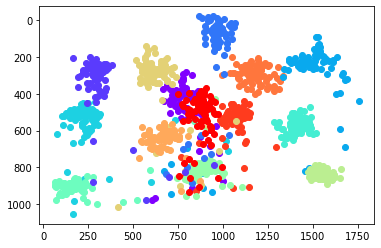

--------------------------------------------------
Recording length :  47.086000
RecStop - RecStart :  47144.0
Frame Count :  1416
FPS :  30.072633054411078
key press times :  [912, 4379, 7763, 11179, 14598, 17969, 21420, 24935, 28330, 31718, 34947, 38239, 41486, 44635]
position update times :  [3423, 6884, 10270, 13684, 17100, 20482, 23934, 27445, 30847, 34229, 37460, 40743, 43992, 47145]
diff :  [2511, 2505, 2507, 2505, 2502, 2513, 2514, 2510, 2517, 2511, 2513, 2504, 2506, 2510]
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(74, 8)


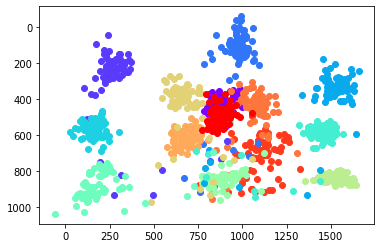

--------------------------------------------------
Recording length :  46.265000
RecStop - RecStart :  46282.0
Frame Count :  1391
FPS :  30.065924565005943
key press times :  [784, 4286, 7780, 11133, 14581, 17934, 21160, 24481, 27676, 30871, 34162, 37293, 40584, 43778]
position update times :  [3292, 6790, 10291, 13642, 17089, 20440, 23670, 26987, 30186, 33386, 36670, 39805, 43087, 46298]
diff :  [2508, 2504, 2511, 2509, 2508, 2506, 2510, 2506, 2510, 2515, 2508, 2512, 2503, 2520]
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(75, 8)


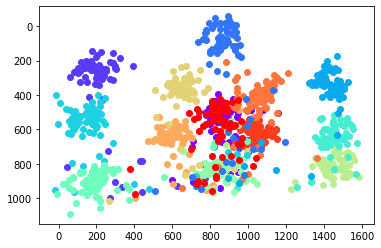

--------------------------------------------------
Recording length :  45.818000
RecStop - RecStart :  45880.0
Frame Count :  1378
FPS :  30.075516172683226
key press times :  [1016, 4337, 7595, 10697, 13859, 17244, 20597, 23887, 27271, 30436, 33725, 36983, 40148, 43374]
position update times :  [3517, 6850, 10104, 13202, 16368, 19751, 23102, 26407, 29787, 32954, 36237, 39485, 42652, 45899]
diff :  [2501, 2513, 2509, 2505, 2509, 2507, 2505, 2520, 2516, 2518, 2512, 2502, 2504, 2525]
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(74, 8)


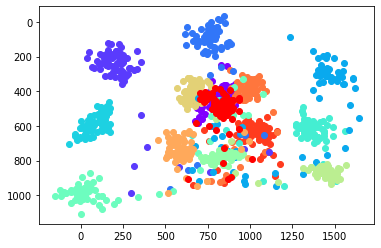

--------------------------------------------------
Recording length :  49.875000
RecStop - RecStart :  49953.0
Frame Count :  1499
FPS :  30.05513784461153
key press times :  [1641, 4885, 8167, 11708, 15139, 18591, 22300, 25905, 29575, 33181, 36756, 40302, 43811, 47449]
position update times :  [4144, 7394, 10678, 14225, 17642, 21107, 24804, 28422, 32086, 35686, 39273, 42816, 46317, 49955]
diff :  [2503, 2509, 2511, 2517, 2503, 2516, 2504, 2517, 2511, 2505, 2517, 2514, 2506, 2506]
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(73, 8)


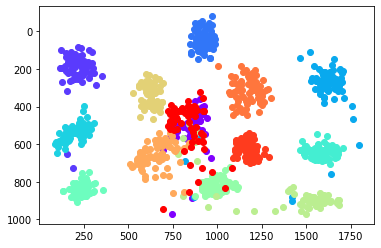

--------------------------------------------------
Recording length :  47.777000
RecStop - RecStart :  47856.0
Frame Count :  1437
FPS :  30.077233815434205
key press times :  [1758, 5221, 8628, 12017, 15516, 18901, 22236, 25586, 28808, 32099, 35334, 38574, 41959, 45345]
position update times :  [4275, 7723, 11137, 14520, 18025, 21404, 24755, 28104, 31317, 34618, 37849, 41083, 44469, 47864]
diff :  [2517, 2502, 2509, 2503, 2509, 2503, 2519, 2518, 2509, 2519, 2515, 2509, 2510, 2519]
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(74, 8)


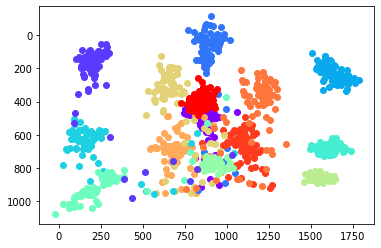

--------------------------------------------------
Recording length :  46.838000
RecStop - RecStart :  46887.0
Frame Count :  1396
FPS :  29.80485930227593
key press times :  [1111, 4445, 7765, 11150, 14408, 17731, 20930, 24138, 27445, 30864, 34406, 37685, 41075, 44382]
position update times :  [3614, 6962, 10281, 13663, 16910, 20242, 23443, 26650, 29959, 33451, 36909, 40188, 43589, 46889]
diff :  [2503, 2517, 2516, 2513, 2502, 2511, 2513, 2512, 2514, 2587, 2503, 2503, 2514, 2507]
(75, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(79, 8)
(76, 8)
(75, 8)
(76, 8)
(74, 8)


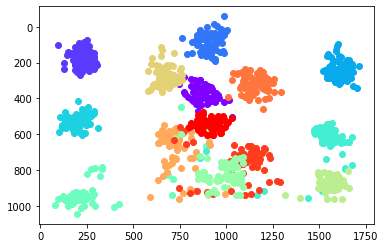

--------------------------------------------------
Recording length :  46.192000
RecStop - RecStart :  46237.0
Frame Count :  1389
FPS :  30.070142015933495
key press times :  [1093, 4227, 7435, 10761, 14028, 17348, 20670, 23991, 27250, 30666, 33862, 37152, 40441, 43731]
position update times :  [3599, 6731, 9947, 13265, 16530, 19864, 23180, 26499, 29767, 33182, 36365, 39666, 42950, 46239]
diff :  [2506, 2504, 2512, 2504, 2502, 2516, 2510, 2508, 2517, 2516, 2503, 2514, 2509, 2508]
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(75, 8)


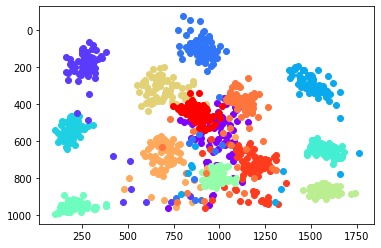

--------------------------------------------------
Recording length :  44.131000
RecStop - RecStart :  44183.0
Frame Count :  1326
FPS :  30.046905803176905
key press times :  [1022, 4315, 7451, 10549, 13743, 16875, 20007, 23076, 26145, 29245, 32345, 35413, 38578, 41678]
position update times :  [3534, 6818, 9967, 13050, 16250, 19384, 22516, 25582, 28655, 31755, 34856, 37922, 41090, 44199]
diff :  [2512, 2503, 2516, 2501, 2507, 2509, 2509, 2506, 2510, 2510, 2511, 2509, 2512, 2521]
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(74, 8)


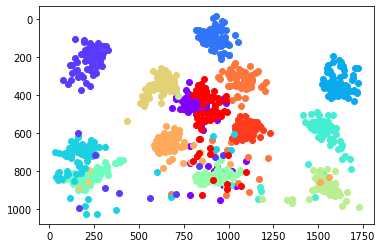

--------------------------------------------------


In [175]:
# fix_analyse = Fixation("8","E","Beg", show = False)
trial_x,trial_y = fix_analyse.parse_trials(pred_path.MPII, show = True)

In [176]:
error = []
for i in range(13):
    pt = fix_analyse.gt_points[i]
#     X = winsorize(mean_x[i], limits=[0.1,0.1])
#     Y = winsorize(mean_y[i], limits=[0.1,0.1])
    X = statistics.median(trial_x[i])
    Y = statistics.median(trial_y[i])
    dist = get_dist(pt,(X,Y))
    print("pt{:<10}".format(i),dist)
    error.append(dist)
print("-"*50)
mean = statistics.mean(error)
sd = statistics.stdev(error)
print("{:<12}".format("Mean error"), mean)
print("{:<12}".format("vis deg"), round(fu_to_deg(mean),1))
print("{:<12}".format("Stdev"), sd)
print("{:<12}".format("vis deg"), round(fu_to_deg(sd),1))

pt0          53.66854292786418
pt1          116.23924681449033
pt2          107.19724809900671
pt3          211.69036940777443
pt4          97.53749279123387
pt5          209.70649131583886
pt6          117.08650648131919
pt7          115.55220681579387
pt8          167.37028559454632
pt9          52.38439653179179
pt10         112.23440871675673
pt11         119.54209509624633
pt12         122.20909336051879
--------------------------------------------------
Mean error   123.26295261178319
vis deg      2.3
Stdev        48.569476589837095
vis deg      0.9


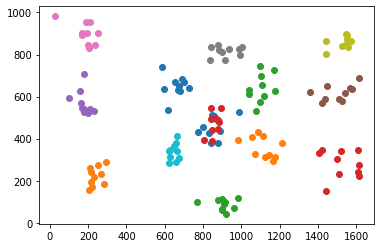

In [177]:
for key in range(0,14):
    plt.scatter(trial_x[key],trial_y[key])
plt.show()
#Mean of means

[]

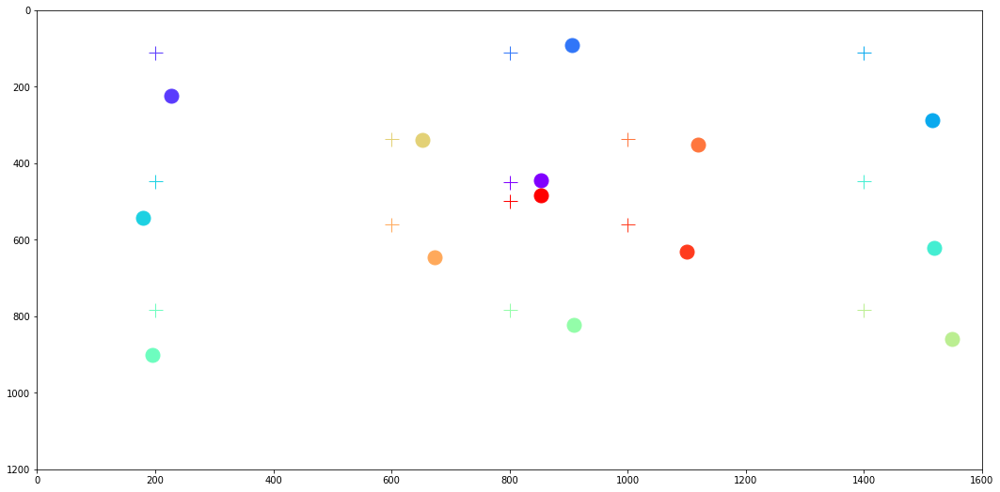

In [179]:
ax = plot_trials(fix_analyse.gt_points, trial_x, trial_y, ylim=1200)
plt.gca().invert_yaxis()

ax.plot()

## ETHXGAZE

Recording length :  49.015000
RecStop - RecStart :  49063.0
Frame Count :  1470
FPS :  29.990819136998876
key press times :  [1079, 4745, 8332, 11782, 15232, 18787, 22353, 25794, 29204, 32734, 36171, 39567, 43090, 46555]
position update times :  [3588, 7255, 10837, 14287, 17736, 21304, 24870, 28303, 31722, 35252, 38682, 42083, 45600, 49064]
diff :  [2509, 2510, 2505, 2505, 2504, 2517, 2517, 2509, 2518, 2518, 2511, 2516, 2510, 2509]
(76, 8)
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(74, 8)


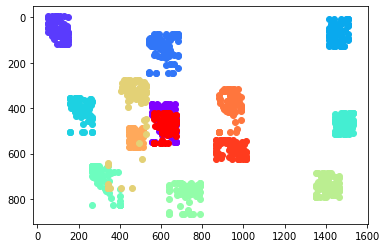

--------------------------------------------------
Recording length :  48.652000
RecStop - RecStart :  48723.0
Frame Count :  1448
FPS :  29.76239414618104
key press times :  [1025, 4421, 7942, 11424, 15050, 18660, 22174, 25690, 29283, 32797, 36289, 39526, 42777, 46214]
position update times :  [3528, 6922, 10457, 13941, 17555, 21170, 24686, 28201, 31803, 35303, 38796, 42030, 45280, 48730]
diff :  [2503, 2501, 2515, 2517, 2505, 2510, 2512, 2511, 2520, 2506, 2507, 2504, 2503, 2516]
(76, 8)
(76, 8)
(76, 8)
(75, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(75, 8)
(75, 8)
(75, 8)
(75, 8)
(73, 8)


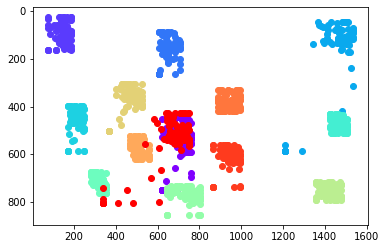

--------------------------------------------------
Recording length :  47.086000
RecStop - RecStart :  47144.0
Frame Count :  1416
FPS :  30.072633054411078
key press times :  [912, 4379, 7763, 11179, 14598, 17969, 21420, 24935, 28330, 31718, 34947, 38239, 41486, 44635]
position update times :  [3423, 6884, 10270, 13684, 17100, 20482, 23934, 27445, 30847, 34229, 37460, 40743, 43992, 47145]
diff :  [2511, 2505, 2507, 2505, 2502, 2513, 2514, 2510, 2517, 2511, 2513, 2504, 2506, 2510]
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(74, 8)


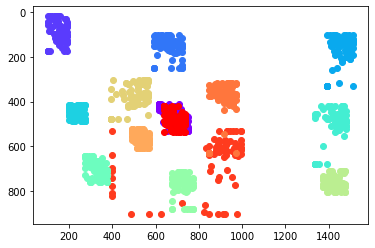

--------------------------------------------------
Recording length :  46.265000
RecStop - RecStart :  46282.0
Frame Count :  1391
FPS :  30.065924565005943
key press times :  [784, 4286, 7780, 11133, 14581, 17934, 21160, 24481, 27676, 30871, 34162, 37293, 40584, 43778]
position update times :  [3292, 6790, 10291, 13642, 17089, 20440, 23670, 26987, 30186, 33386, 36670, 39805, 43087, 46298]
diff :  [2508, 2504, 2511, 2509, 2508, 2506, 2510, 2506, 2510, 2515, 2508, 2512, 2503, 2520]
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(75, 8)


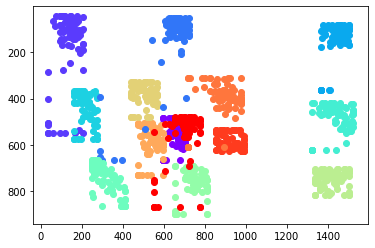

--------------------------------------------------
Recording length :  45.818000
RecStop - RecStart :  45880.0
Frame Count :  1378
FPS :  30.075516172683226
key press times :  [1016, 4337, 7595, 10697, 13859, 17244, 20597, 23887, 27271, 30436, 33725, 36983, 40148, 43374]
position update times :  [3517, 6850, 10104, 13202, 16368, 19751, 23102, 26407, 29787, 32954, 36237, 39485, 42652, 45899]
diff :  [2501, 2513, 2509, 2505, 2509, 2507, 2505, 2520, 2516, 2518, 2512, 2502, 2504, 2525]
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(74, 8)


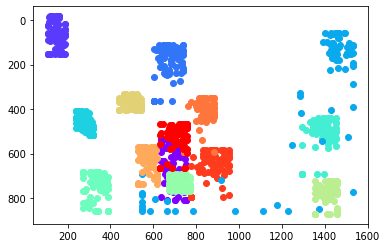

--------------------------------------------------
Recording length :  49.875000
RecStop - RecStart :  49953.0
Frame Count :  1499
FPS :  30.05513784461153
key press times :  [1641, 4885, 8167, 11708, 15139, 18591, 22300, 25905, 29575, 33181, 36756, 40302, 43811, 47449]
position update times :  [4144, 7394, 10678, 14225, 17642, 21107, 24804, 28422, 32086, 35686, 39273, 42816, 46317, 49955]
diff :  [2503, 2509, 2511, 2517, 2503, 2516, 2504, 2517, 2511, 2505, 2517, 2514, 2506, 2506]
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(73, 8)


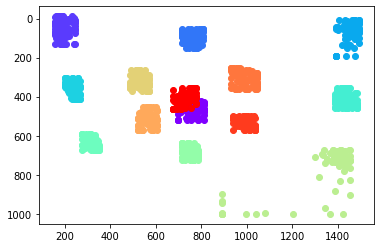

--------------------------------------------------
Recording length :  47.777000
RecStop - RecStart :  47856.0
Frame Count :  1437
FPS :  30.077233815434205
key press times :  [1758, 5221, 8628, 12017, 15516, 18901, 22236, 25586, 28808, 32099, 35334, 38574, 41959, 45345]
position update times :  [4275, 7723, 11137, 14520, 18025, 21404, 24755, 28104, 31317, 34618, 37849, 41083, 44469, 47864]
diff :  [2517, 2502, 2509, 2503, 2509, 2503, 2519, 2518, 2509, 2519, 2515, 2509, 2510, 2519]
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(74, 8)


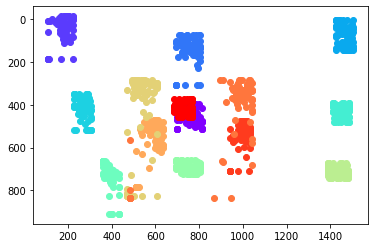

--------------------------------------------------
Recording length :  46.838000
RecStop - RecStart :  46887.0
Frame Count :  1396
FPS :  29.80485930227593
key press times :  [1111, 4445, 7765, 11150, 14408, 17731, 20930, 24138, 27445, 30864, 34406, 37685, 41075, 44382]
position update times :  [3614, 6962, 10281, 13663, 16910, 20242, 23443, 26650, 29959, 33451, 36909, 40188, 43589, 46889]
diff :  [2503, 2517, 2516, 2513, 2502, 2511, 2513, 2512, 2514, 2587, 2503, 2503, 2514, 2507]
(75, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(79, 8)
(76, 8)
(75, 8)
(76, 8)
(74, 8)


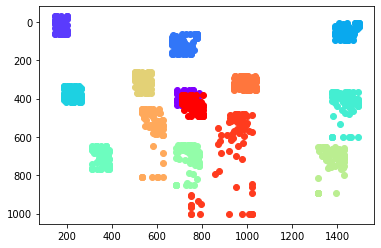

--------------------------------------------------
Recording length :  46.192000
RecStop - RecStart :  46237.0
Frame Count :  1389
FPS :  30.070142015933495
key press times :  [1093, 4227, 7435, 10761, 14028, 17348, 20670, 23991, 27250, 30666, 33862, 37152, 40441, 43731]
position update times :  [3599, 6731, 9947, 13265, 16530, 19864, 23180, 26499, 29767, 33182, 36365, 39666, 42950, 46239]
diff :  [2506, 2504, 2512, 2504, 2502, 2516, 2510, 2508, 2517, 2516, 2503, 2514, 2509, 2508]
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(75, 8)


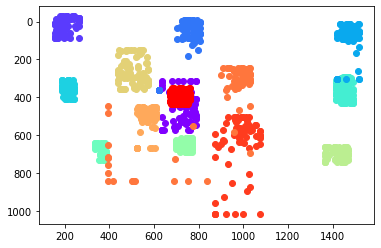

--------------------------------------------------
Recording length :  44.131000
RecStop - RecStart :  44183.0
Frame Count :  1326
FPS :  30.046905803176905
key press times :  [1022, 4315, 7451, 10549, 13743, 16875, 20007, 23076, 26145, 29245, 32345, 35413, 38578, 41678]
position update times :  [3534, 6818, 9967, 13050, 16250, 19384, 22516, 25582, 28655, 31755, 34856, 37922, 41090, 44199]
diff :  [2512, 2503, 2516, 2501, 2507, 2509, 2509, 2506, 2510, 2510, 2511, 2509, 2512, 2521]
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(74, 8)


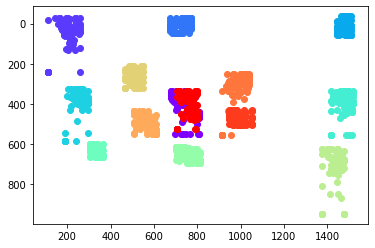

--------------------------------------------------


In [86]:
# fix_analyse = Fixation("8","E","Beg", show = False)
trial_x,trial_y = fix_analyse.parse_trials(pred_path.ETH, show = True)

In [87]:
error = []
for i in range(13):
    pt = fix_analyse.gt_points[i]
#     X = winsorize(mean_x[i], limits=[0.1,0.1])
#     Y = winsorize(mean_y[i], limits=[0.1,0.1])
    X = statistics.median(trial_x[i])
    Y = statistics.median(trial_y[i])
    dist = get_dist(pt,(X,Y))
    print("pt{:<10}".format(i),dist)
    error.append(dist)
print("-"*50)
mean = statistics.mean(error)
sd = statistics.stdev(error)
print("{:<12}".format("Mean error"), mean)
print("{:<12}".format("vis deg"), round(fu_to_deg(mean),1))
print("{:<12}".format("Stdev"), sd)
print("{:<12}".format("vis deg"), round(fu_to_deg(sd),1))

pt0          78.17488407410656
pt1          72.71863585079137
pt2          106.6770828247567
pt3          75.50041390615021
pt4          56.2072059437222
pt5          46.50604799378249
pt6          157.9952530932496
pt7          90.5573023008084
pt8          54.70831746635972
pt9          87.28115489611719
pt10         39.53558523659413
pt11         49.78076937934969
pt12         54.67003292481174
--------------------------------------------------
Mean error   74.63943737620001
vis deg      1.4
Stdev        31.861967330628087
vis deg      0.6


[]

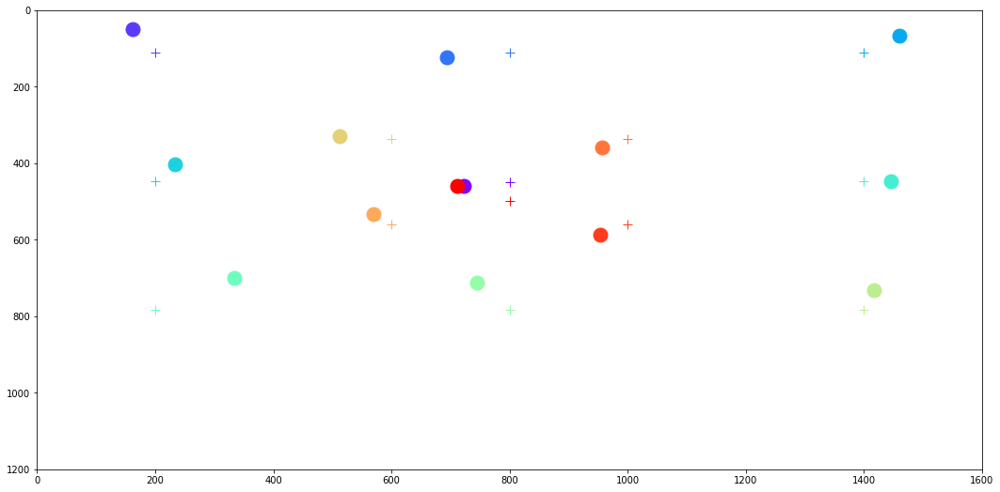

In [88]:
ax = plot_trials(fix_analyse.gt_points, trial_x, trial_y, ylim=1200)
plt.gca().invert_yaxis()
ax.plot()

## FAZE

Recording length :  49.015000
RecStop - RecStart :  49063.0
Frame Count :  1470
FPS :  29.990819136998876
key press times :  [1079, 4745, 8332, 11782, 15232, 18787, 22353, 25794, 29204, 32734, 36171, 39567, 43090, 46555]
position update times :  [3588, 7255, 10837, 14287, 17736, 21304, 24870, 28303, 31722, 35252, 38682, 42083, 45600, 49064]
diff :  [2509, 2510, 2505, 2505, 2504, 2517, 2517, 2509, 2518, 2518, 2511, 2516, 2510, 2509]
(76, 8)
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(74, 8)


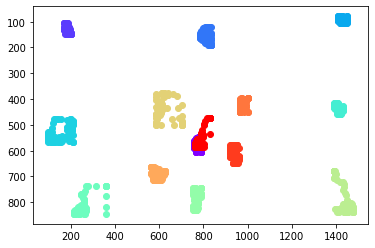

--------------------------------------------------
Recording length :  48.652000
RecStop - RecStart :  48723.0
Frame Count :  1448
FPS :  29.76239414618104
key press times :  [1025, 4421, 7942, 11424, 15050, 18660, 22174, 25690, 29283, 32797, 36289, 39526, 42777, 46214]
position update times :  [3528, 6922, 10457, 13941, 17555, 21170, 24686, 28201, 31803, 35303, 38796, 42030, 45280, 48730]
diff :  [2503, 2501, 2515, 2517, 2505, 2510, 2512, 2511, 2520, 2506, 2507, 2504, 2503, 2516]
(76, 8)
(76, 8)
(76, 8)
(75, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(75, 8)
(75, 8)
(75, 8)
(75, 8)
(73, 8)


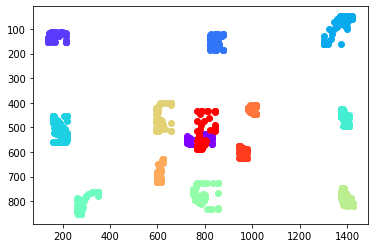

--------------------------------------------------
Recording length :  47.086000
RecStop - RecStart :  47144.0
Frame Count :  1416
FPS :  30.072633054411078
key press times :  [912, 4379, 7763, 11179, 14598, 17969, 21420, 24935, 28330, 31718, 34947, 38239, 41486, 44635]
position update times :  [3423, 6884, 10270, 13684, 17100, 20482, 23934, 27445, 30847, 34229, 37460, 40743, 43992, 47145]
diff :  [2511, 2505, 2507, 2505, 2502, 2513, 2514, 2510, 2517, 2511, 2513, 2504, 2506, 2510]
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(74, 8)


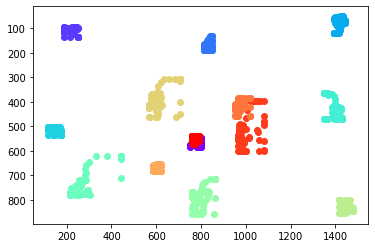

--------------------------------------------------
Recording length :  46.265000
RecStop - RecStart :  46282.0
Frame Count :  1391
FPS :  30.065924565005943
key press times :  [784, 4286, 7780, 11133, 14581, 17934, 21160, 24481, 27676, 30871, 34162, 37293, 40584, 43778]
position update times :  [3292, 6790, 10291, 13642, 17089, 20440, 23670, 26987, 30186, 33386, 36670, 39805, 43087, 46298]
diff :  [2508, 2504, 2511, 2509, 2508, 2506, 2510, 2506, 2510, 2515, 2508, 2512, 2503, 2520]
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(75, 8)


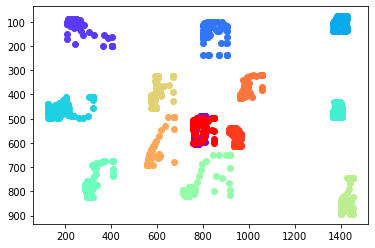

--------------------------------------------------
Recording length :  45.818000
RecStop - RecStart :  45880.0
Frame Count :  1378
FPS :  30.075516172683226
key press times :  [1016, 4337, 7595, 10697, 13859, 17244, 20597, 23887, 27271, 30436, 33725, 36983, 40148, 43374]
position update times :  [3517, 6850, 10104, 13202, 16368, 19751, 23102, 26407, 29787, 32954, 36237, 39485, 42652, 45899]
diff :  [2501, 2513, 2509, 2505, 2509, 2507, 2505, 2520, 2516, 2518, 2512, 2502, 2504, 2525]
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(74, 8)


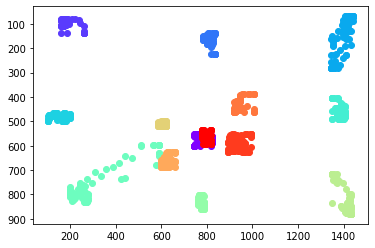

--------------------------------------------------
Recording length :  49.875000
RecStop - RecStart :  49953.0
Frame Count :  1499
FPS :  30.05513784461153
key press times :  [1641, 4885, 8167, 11708, 15139, 18591, 22300, 25905, 29575, 33181, 36756, 40302, 43811, 47449]
position update times :  [4144, 7394, 10678, 14225, 17642, 21107, 24804, 28422, 32086, 35686, 39273, 42816, 46317, 49955]
diff :  [2503, 2509, 2511, 2517, 2503, 2516, 2504, 2517, 2511, 2505, 2517, 2514, 2506, 2506]
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(73, 8)


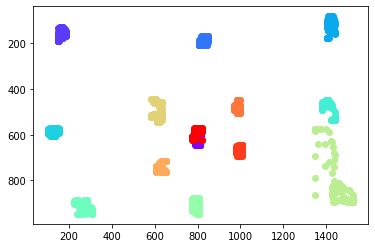

--------------------------------------------------
Recording length :  47.777000
RecStop - RecStart :  47856.0
Frame Count :  1437
FPS :  30.077233815434205
key press times :  [1758, 5221, 8628, 12017, 15516, 18901, 22236, 25586, 28808, 32099, 35334, 38574, 41959, 45345]
position update times :  [4275, 7723, 11137, 14520, 18025, 21404, 24755, 28104, 31317, 34618, 37849, 41083, 44469, 47864]
diff :  [2517, 2502, 2509, 2503, 2509, 2503, 2519, 2518, 2509, 2519, 2515, 2509, 2510, 2519]
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(74, 8)


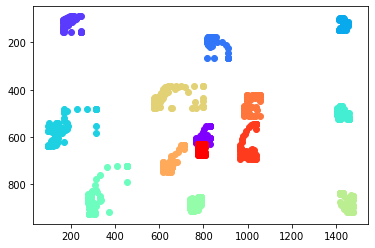

--------------------------------------------------
Recording length :  46.838000
RecStop - RecStart :  46887.0
Frame Count :  1396
FPS :  29.80485930227593
key press times :  [1111, 4445, 7765, 11150, 14408, 17731, 20930, 24138, 27445, 30864, 34406, 37685, 41075, 44382]
position update times :  [3614, 6962, 10281, 13663, 16910, 20242, 23443, 26650, 29959, 33451, 36909, 40188, 43589, 46889]
diff :  [2503, 2517, 2516, 2513, 2502, 2511, 2513, 2512, 2514, 2587, 2503, 2503, 2514, 2507]
(75, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(79, 8)
(76, 8)
(75, 8)
(76, 8)
(74, 8)


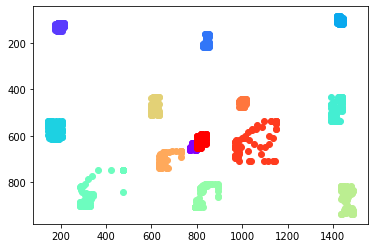

--------------------------------------------------
Recording length :  46.192000
RecStop - RecStart :  46237.0
Frame Count :  1389
FPS :  30.070142015933495
key press times :  [1093, 4227, 7435, 10761, 14028, 17348, 20670, 23991, 27250, 30666, 33862, 37152, 40441, 43731]
position update times :  [3599, 6731, 9947, 13265, 16530, 19864, 23180, 26499, 29767, 33182, 36365, 39666, 42950, 46239]
diff :  [2506, 2504, 2512, 2504, 2502, 2516, 2510, 2508, 2517, 2516, 2503, 2514, 2509, 2508]
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(75, 8)


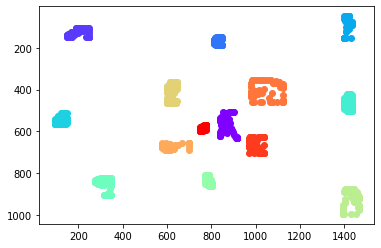

--------------------------------------------------
Recording length :  44.131000
RecStop - RecStart :  44183.0
Frame Count :  1326
FPS :  30.046905803176905
key press times :  [1022, 4315, 7451, 10549, 13743, 16875, 20007, 23076, 26145, 29245, 32345, 35413, 38578, 41678]
position update times :  [3534, 6818, 9967, 13050, 16250, 19384, 22516, 25582, 28655, 31755, 34856, 37922, 41090, 44199]
diff :  [2512, 2503, 2516, 2501, 2507, 2509, 2509, 2506, 2510, 2510, 2511, 2509, 2512, 2521]
(77, 8)
(76, 8)
(77, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(76, 8)
(76, 8)
(77, 8)
(77, 8)
(76, 8)
(76, 8)
(74, 8)


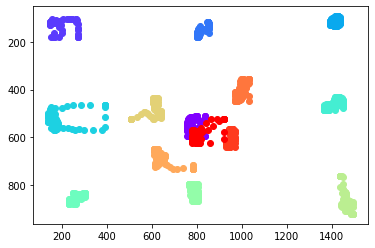

--------------------------------------------------


In [89]:
trial_x,trial_y = fix_analyse.parse_trials(pred_path.FAZE, show = True)

In [92]:
error = []
for i in range(13):
    pt = fix_analyse.gt_points[i]
#     X = winsorize(mean_x[i], limits=[0.1,0.1])
#     Y = winsorize(mean_y[i], limits=[0.1,0.1])
    X = statistics.median(trial_x[i])
    Y = statistics.median(trial_y[i])
    dist = get_dist(pt,(X,Y))
    print("pt{:<10}".format(i),dist)
    error.append(dist)
print("-"*50)
mean = statistics.mean(error)
sd = statistics.stdev(error)
print("{:<12}".format("Mean error"), mean)
print("{:<12}".format("vis deg"), round(fu_to_deg(mean),1))
print("{:<12}".format("Stdev"), sd)
print("{:<12}".format("vis deg"), round(fu_to_deg(sd),1))

pt0          124.87718967049186
pt1          16.101242188104617
pt2          55.823382197785186
pt3          22.619129072535042
pt4          92.44728227481866
pt5          14.450346016618425
pt6          86.2670273047588
pt7          54.70831746635972
pt8          69.32937689031974
pt9          124.52359214221215
pt10         127.91232348761397
pt11         93.26105832554121
pt12         59.63430220938282
--------------------------------------------------
Mean error   72.45804378819555
vis deg      1.3
Stdev        40.1535485927076
vis deg      0.7


[]

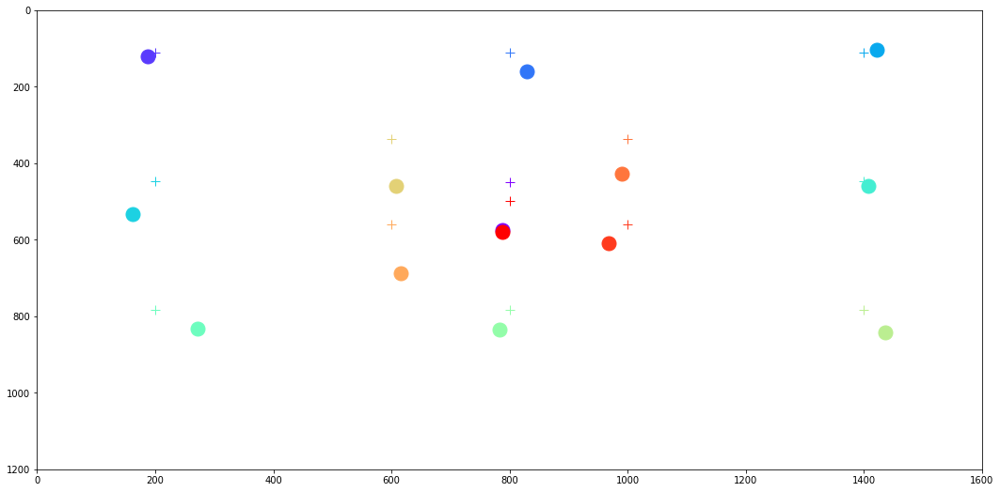

In [91]:
ax = plot_trials(fix_analyse.gt_points, trial_x, trial_y,ylim = 1200)
plt.gca().invert_yaxis()
ax.plot()

# Smooth Pursuit

In [361]:
import ffmpeg    

class Smooth_Pursuit():
    def __init__(self, subb, pre, calib_block, show=True):
        
        self.subb = subb
        self.pre = pre
        self.calib_block = calib_block
        self.df = pd.read_csv("Subjects/s"+subb+"/data.csv")
        self.task_df = self.df[self.df["Task_Name"] == "2. Smooth Pursuit"]
        self.palette = cm.rainbow(np.linspace(0, 1, 12))
        self.angles = [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]
        if show:
            print("sp_df summary \n {}".format(self.summary()))

    def summary(self):
        print(self.task_df.iloc[0].dropna()[7:22])
    
    def parse_trials(self, model, show = True, model_outputs = False):
        
        trial_x = {key:[] for key in self.angles}
        trial_y = {key:[] for key in self.angles}
        
        for _,row in self.task_df.iterrows():
            
            seq = [int(i) for i in row.angles.split(";")]
            
            rec_name = row.pursuit_rec
            rec_id = row.rec_session_id
            fname = "Subjects/s{}/{}/{}".format(self.subb,rec_id,rec_name)

            start_times = row.anim_time.split("---values=")[1].strip("\"").split(";")
            start_times = [int(t) - int(row.RecStart) for t in start_times if len(t)>1]
            
            stop_times = row.ResetTimes.split("---values=")[1].strip("\"").split(";")
            stop_times = [int(t) - int(row.RecStart) for t in stop_times if len(t)>1]

            if show:
                vid_len = ffmpeg.probe(fname)["format"]["duration"]
                print("Recording length : ",vid_len)
                print("RecStop - RecStart : ",row.RecStop - row.RecStart)
                c = get_frame_count(fname)
                print("Frame Count : ",c)
                print("FPS : ",c/float(vid_len))
                print("start times : ",start_times)
                print("stop times : ",stop_times)
                print("diff : ", [int(i)-int(j) for i,j in zip(stop_times,start_times)])
                
            if model_outputs:
                pred_df = pd.read_csv(os.path.join(model.value, "s{}/model_outputs/Block_{}".format(subb,str(row.Block_Nr)),"Fixation{}.csv".format(row.Trial_Id)))
            else:
                if model.name == "FAZE":
                    pred_df = pd.read_csv(os.path.join(model.value, "s{}/pix_to_fu/Block_{}/Smooth Pursuit{}.csv".format(self.subb,str(row.Block_Nr),row.Trial_Id)))
                else:
                    pred_df = pd.read_csv(os.path.join(model.value, "s{}/pix_to_fu/{}_preds/{}/Block_{}/Smooth Pursuit{}.csv".format(self.subb,self.pre,self.calib_block,str(row.Block_Nr),row.Trial_Id)))
            
            l = [(int(j),int(i)) for i,j in zip(time_to_frame(stop_times, fname),time_to_frame(start_times, fname))]
            for index,pt in enumerate(l):
#                 sub = pred_df.iloc[pt[0]:pt[1]]
                sub = pred_df[pred_df.frame.between(pt[0],pt[1])]
#                 X = winsorize(sub.poly_x, limits=[0.1,0.1])
#                 Y = winsorize(sub.poly_y, limits=[0.1,0.1])

                trial_x[seq[index]].append(sub.poly_x)
                trial_y[seq[index]].append(sub.poly_y)
                
                if show: 
                    plt.scatter(sub.poly_x,sub.poly_y, color = self.palette[self.angles.index(seq[index])])
            if show:
#                     plt.xlim(0,max(1600,sub.poly_x.max()))
#                     plt.ylim(0,max(900,sub.poly_y.max()))
                    plt.gca().invert_yaxis()
                    plt.show()
                    print("-"*50)
        return trial_x,trial_y

In [362]:
SP_analyze = Smooth_Pursuit("8", "E", "Beg", show=True)

angles                  90;300;270;120;60;180;330;210;30;150;240;0
anim_time        "times=1630506334133;1630506335443;16305063383...
animate_var      "times=1630506335413;1630506336223;16305063383...
ClickTimes       "times=1630506334134;1630506335195;16305063375...
Condition_Id                                                     1
curr_angle       "times=1630506335410;1630506338310;16305063408...
FrameEnd                                           1630506365882.0
FrameStart                                         1630506334135.0
pursuit_rec         blockNr_13_taskNr_6_trialNr_1_pursuit_rec.webm
rand             "times=1630506333605;1630506334133;16305063341...
RecStart                                                       2.0
RecStop                                                    31170.0
ResetTimes       "times=1630506334134;1630506336733;16305063396...
stop_anim        "times=1630506336223;1630506336731;16305063390...
upload_failed                                                F

In [ ]:
# angles =[i for i in SP_analyze.angles]
# center = [800,450]
# from IPython.display import display, clear_output
# pts = []
# for angle in angles:
#     X = center[0]+(450*np.cos(angle*np.pi/180))
#     Y = center[1]+(450*np.sin(angle*np.pi/180))
#     pts.append((X,Y))
#     plt.plot([center[0],X],[center[1],Y])
#     plt.xlim(0,1600)
#     plt.ylim(0,900)
#     plt.pause(0.6)
#     clear_output()

### ETHXGaze

Recording length :  31.144000
RecStop - RecStart :  31168.0
Frame Count :  934
FPS :  29.989725147701
start times :  [1306, 4196, 6708, 9582, 12031, 14275, 17860, 20870, 23226, 25433, 27676, 29868]
stop times :  [2596, 5479, 8014, 10858, 13312, 15578, 19144, 22159, 24500, 26712, 28955, 31169]
diff :  [1290, 1283, 1306, 1276, 1281, 1303, 1284, 1289, 1274, 1279, 1279, 1301]


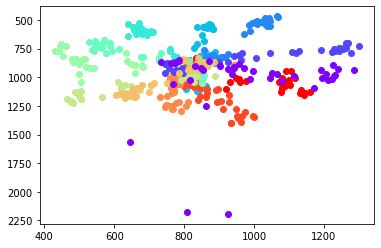

--------------------------------------------------
Recording length :  33.115000
RecStop - RecStart :  33119.0
Frame Count :  993
FPS :  29.986410991997584
start times :  [1756, 4737, 7280, 9871, 12916, 15283, 18019, 20629, 24118, 26782, 29212, 31801]
stop times :  [3029, 6015, 8558, 11171, 14187, 16561, 19288, 21901, 25399, 28071, 30513, 33121]
diff :  [1273, 1278, 1278, 1300, 1271, 1278, 1269, 1272, 1281, 1289, 1301, 1320]


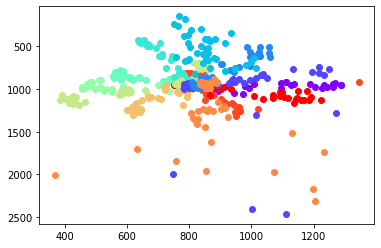

--------------------------------------------------
Recording length :  32.694000
RecStop - RecStart :  32719.0
Frame Count :  981
FPS :  30.00550559735731
start times :  [1419, 3738, 6093, 8554, 11384, 13892, 17687, 21147, 23547, 25955, 28860, 31403]
stop times :  [2693, 5012, 7404, 9827, 12662, 15192, 18949, 22418, 24826, 27260, 30132, 32721]
diff :  [1274, 1274, 1311, 1273, 1278, 1300, 1262, 1271, 1279, 1305, 1272, 1318]


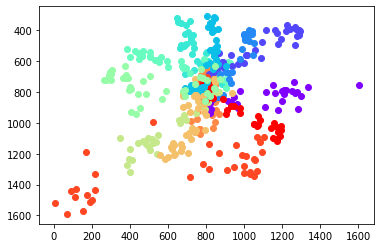

--------------------------------------------------
Recording length :  28.373000
RecStop - RecStart :  28395.0
Frame Count :  851
FPS :  29.993303492757196
start times :  [1802, 4207, 6645, 8817, 11217, 13551, 15812, 18148, 20373, 22584, 24906, 27090]
stop times :  [3085, 5510, 7930, 10122, 12497, 14830, 17133, 19435, 21641, 23857, 26184, 28398]
diff :  [1283, 1303, 1285, 1305, 1280, 1279, 1321, 1287, 1268, 1273, 1278, 1308]


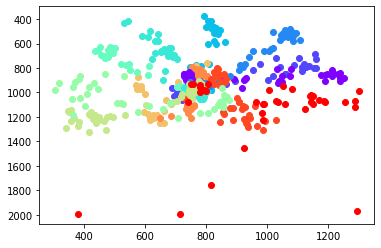

--------------------------------------------------
Recording length :  29.538000
RecStop - RecStart :  29534.0
Frame Count :  886
FPS :  29.99526034260952
start times :  [1699, 4094, 6469, 8748, 11193, 13660, 16354, 18762, 21001, 23511, 25767, 28253]
stop times :  [2993, 5406, 7744, 10031, 12480, 14945, 17658, 20063, 22269, 24790, 27052, 29536]
diff :  [1294, 1312, 1275, 1283, 1287, 1285, 1304, 1301, 1268, 1279, 1285, 1283]


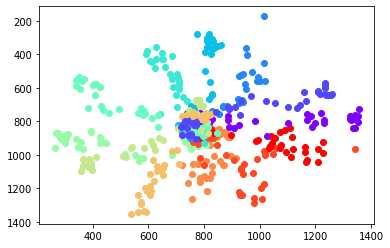

--------------------------------------------------
Recording length :  35.510000
RecStop - RecStart :  35520.0
Frame Count :  1066
FPS :  30.01971275696987
start times :  [4269, 7563, 10389, 13549, 16120, 18920, 21718, 24579, 26878, 29263, 31913, 34232]
stop times :  [5565, 8841, 11684, 14858, 17407, 20200, 23023, 25873, 28191, 30547, 33201, 35522]
diff :  [1296, 1278, 1295, 1309, 1287, 1280, 1305, 1294, 1313, 1284, 1288, 1290]


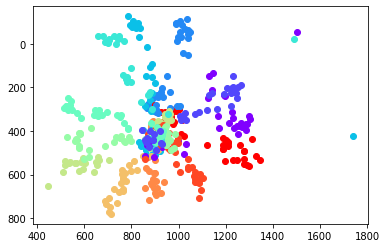

--------------------------------------------------
Recording length :  34.254000
RecStop - RecStart :  34267.0
Frame Count :  1027
FPS :  29.981899924096457
start times :  [1704, 3944, 6382, 8699, 11724, 15484, 17841, 21264, 23713, 27007, 29958, 32980]
stop times :  [3010, 5252, 7660, 9984, 13010, 16800, 19119, 22558, 24999, 28308, 31246, 34268]
diff :  [1306, 1308, 1278, 1285, 1286, 1316, 1278, 1294, 1286, 1301, 1288, 1288]


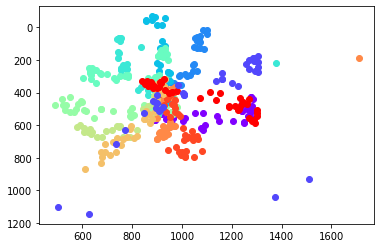

--------------------------------------------------
Recording length :  33.136000
RecStop - RecStart :  33126.0
Frame Count :  994
FPS :  29.99758570738773
start times :  [2049, 5036, 7344, 9446, 12133, 14596, 17050, 19507, 23299, 25775, 28971, 31845]
stop times :  [3342, 6315, 8623, 10753, 13414, 15874, 18317, 20814, 24608, 27077, 30257, 33127]
diff :  [1293, 1279, 1279, 1307, 1281, 1278, 1267, 1307, 1309, 1302, 1286, 1282]


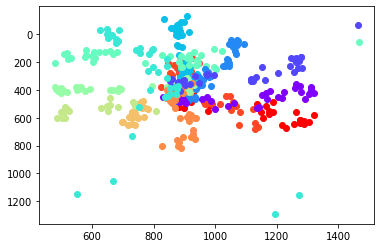

--------------------------------------------------
Recording length :  33.269000
RecStop - RecStart :  33274.0
Frame Count :  998
FPS :  29.997895939162586
start times :  [2732, 5120, 7592, 11554, 13986, 15801, 18003, 20456, 22864, 26679, 28924, 31957]
stop times :  [4018, 6422, 8881, 12844, 15263, 17090, 19283, 21738, 24176, 27983, 30202, 33275]
diff :  [1286, 1302, 1289, 1290, 1277, 1289, 1280, 1282, 1312, 1304, 1278, 1318]


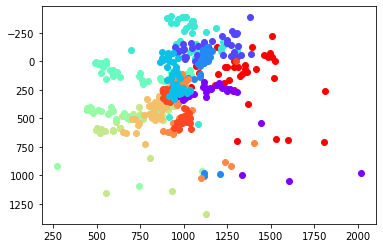

--------------------------------------------------
Recording length :  29.200000
RecStop - RecStart :  29215.0
Frame Count :  876
FPS :  30.0
start times :  [1748, 4443, 6967, 9212, 11458, 13426, 15604, 18505, 21005, 23406, 25629, 27947]
stop times :  [3044, 5717, 8240, 10482, 12764, 14716, 16911, 19812, 22289, 24684, 26898, 29217]
diff :  [1296, 1274, 1273, 1270, 1306, 1290, 1307, 1307, 1284, 1278, 1269, 1270]


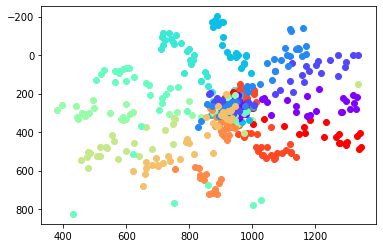

--------------------------------------------------


In [363]:
trial_x,trial_y = SP_analyze.parse_trials(pred_path.ETH, show = True)

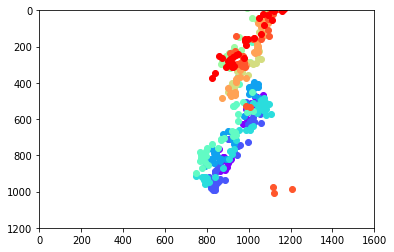

In [13]:
##Test
color = iter(cm.rainbow(np.linspace(0,1,10)))
for i in range(10):
    plt.scatter(trial_x[60][i],trial_y[60][i],color = next(color))
plt.xlim(0,1600)
plt.ylim(0,1200)
plt.gca().invert_yaxis()

In [374]:
from scipy.stats import circmean as cim, circstd as cis

def process_trials(trial_x, trial_y, show = False):
    avg = {k:[] for k in SP_analyze.angles}
    for angle in trial_x.keys():
        for trial in range(10):
#             sm_x = savgol_filter(trial_x[angle][trial], 7, 1)
#             sm_y = savgol_filter(trial_y[angle][trial], 7, 1)

            #rolling mean
            sm_x = trial_x[angle][trial].rolling(15).mean().dropna()
            sm_y = trial_y[angle][trial].rolling(15).mean().dropna()
            
            model = LinearRegression()
            X = np.array(sm_x).reshape(-1,1)
            Y = sm_y
            model.fit(X,Y)
            pred = model.predict(X)                                 
            
            math.degrees(math.atan(model.coef_))
            ang = np.rad2deg(np.arctan2(pred[-1] - pred[0], X[-1] - X[0])) 
            ang = -ang if ang<0 else 360-ang #invert y-axis
            
            if show:                
                plt.scatter(X,Y)
                plt.scatter(trial_x[angle][trial], trial_y[angle][trial], color = "black")
                plt.plot(X,pred, color = "orange")
                plt.gca().invert_yaxis()
                plt.show()
                print("ang ",ang)
            avg[angle].append(ang[0])
    return avg

In [376]:
avg = process_trials(trial_x,trial_y)
for angle in avg.keys():
    cmean = cim(avg[angle], high=360, low=0) #Filter Outliers ? trimmed mean oder std rule
    diff = abs(cmean-angle)
    print("*"*50)
    print("angle: ",angle)
    print("diff: ", diff if diff<180 else 360-diff)
    print("mean: ", cmean)
    print("stdv: ", cis(avg[angle], high=360, low=0))

**************************************************
angle:  0
diff:  4.272935150007854
mean:  4.272935150007854
stdv:  6.3688034074286985
**************************************************
angle:  30
diff:  6.660651695276183
mean:  23.339348304723817
stdv:  12.616086369717184
**************************************************
angle:  60
diff:  3.4137330948168056
mean:  63.413733094816806
stdv:  6.740883320301708
**************************************************
angle:  90
diff:  0.6568961699963438
mean:  90.65689616999634
stdv:  39.73395964028964
**************************************************
angle:  120
diff:  4.895619475171131
mean:  115.10438052482887
stdv:  9.38374536566812
**************************************************
angle:  150
diff:  7.770655665624332
mean:  157.77065566562433
stdv:  19.141774498641006
**************************************************
angle:  180
diff:  1.116720903339342
mean:  178.88327909666066
stdv:  7.431057170135371
******************************

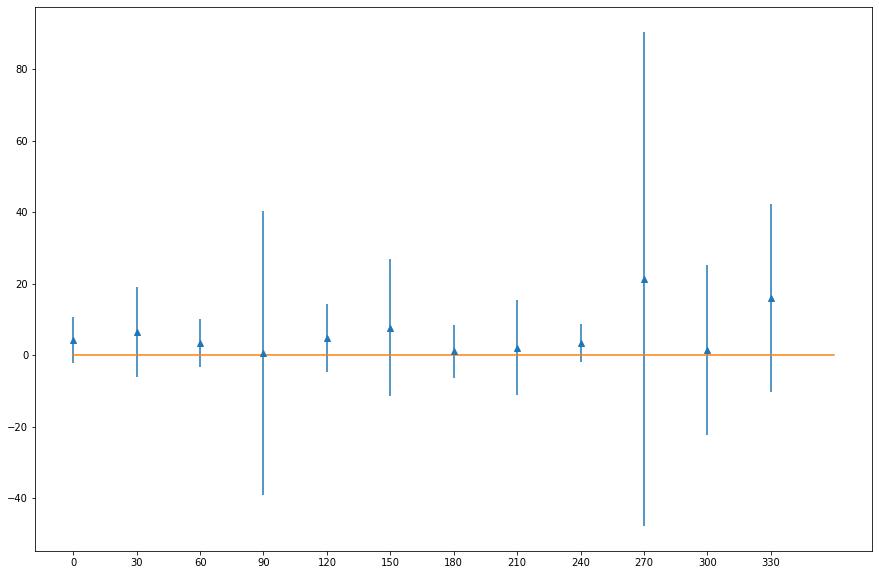

In [377]:
cmeans = np.array([cim(avg[k], high=360, low=0) for k in avg.keys()])
diffs = abs(cmeans-SP_analyze.angles)
diffs = np.array([diff if diff<180 else 360-diff for diff in diffs])
cstds = np.array([cs(avg[k], high=360, low=0) for k in avg.keys()])
plt.figure(figsize=(15,10))
plt.errorbar(avg.keys(), diffs, cstds, linestyle='None', marker='^')
plt.xticks(SP_analyze.angles)
plt.plot([0,360], [0,0], "-")
plt.show()

In [369]:
#mean of mean diffs
print(diffs)
print(cstds)
diffs.mean()

[ 4.27293515  6.6606517   3.41373309  0.65689617  4.89561948  7.77065567
  1.1167209   2.17149575  3.42408619 21.38985021  1.45651836 16.04224074]
[ 6.36880341 12.61608637  6.74088332 39.73395964  9.38374537 19.1417745
  7.43105717 13.31391879  5.34766774 69.11196088 23.76263181 26.36913336]


6.105950283749373

### Temporal (ignore)

In [ ]:
# !pip install dtw
from dtw import dtw, accelerated_dtw
def dtw_dist(d1,d2):
    d, cost_matrix, acc_cost_matrix, path = accelerated_dtw(d1,d2, dist='euclidean')

#     plt.imshow(acc_cost_matrix.T, origin='lower', cmap='gray', interpolation='nearest')
#     plt.plot(path[0], path[1], 'w')
#     plt.xlabel('Subject1')
#     plt.ylabel('Subject2')
#     plt.title(f'DTW Minimum Path with minimum distance: {np.round(d,2)}')
#     plt.show()
    return d

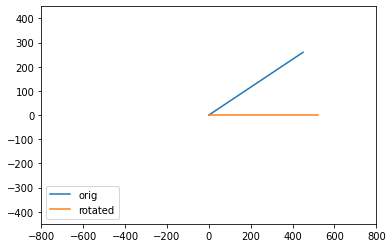

In [590]:
##test 
cos = math.cos(math.radians(30))
sin = math.sin(math.radians(30))
R = np.array([[cos,sin],[-sin,cos]])
pts_x = np.linspace(0,450,451)
pts_y = [i*math.tan(math.radians(30)) for i in pts_x]
plt.plot(pts_x,pts_y,label = "orig")
pts = np.row_stack([pts_x,pts_y])

res = np.matmul(R,pts)
plt.plot(res[0,:],res[1,:], label = "rotated")
plt.xlim(-800,800)
plt.ylim(-450,450)
plt.legend(loc=3)

In [606]:
#velocity
trial_y[150][0].diff()/trial_x[150][0].diff()

In [201]:
def rotate_axis(pts, theta):
    cos = math.cos(math.radians(theta))
    sin = math.sin(math.radians(theta))
    R = np.array([[cos,sin],[-sin,cos]])
    return np.matmul(R,pts)

for angle in SP_analyze.angles:
    for trial in range(10):
        X = trial_x[angle][trial]
        Y = trial_y[angle][trial]
        res = rotate_axis(np.row_stack([X,Y]),angle)
        print("angle: {}, trial {} ".format(angle,trial),dtw_dist(np.arange(0,res[0,:].max()), res[0,:]))
    print("*"*50)

NameError: name 'dtw_dist' is not defined

# Zone Classification

In [725]:
import ffmpeg   

# def plot_zone(x,y,c):
#     plt.plot(x,y,marker="o", markersize = 15,color = c)
#     plt.xlim(0,1600)
#     plt.ylim(0,900)
#     plt.xticks([400,800,1200])
#     plt.yticks([225,450,675])
#     plt.grid("both", markevery = (5,3))
#     plt.gca().invert_yaxis()
    
def plot_zone(grid_size):
    plt.xlim(0,1600)
    plt.ylim(0,900)
    plt.xticks([(i+1)*1600//grid_size[0] for i in range(grid_size[0])])
    plt.yticks([(i+1)*900//grid_size[1] for i in range(grid_size[1])])
    plt.grid("both")
    plt.gca().invert_yaxis()

#is a check needed for inside presentation area ? currently just clipping to stay in boundaries
def clip(i,max):
    if i > max:
        return max
    elif i < 0:
        return 0
    else:
        return i

def get_zone(x,y,grid_size):
    x = clip(x,1599)
    y = clip(y,899)
    c = x//(1600//grid_size[0])
    r = y//(900//grid_size[1])
    return int(c+(r*grid_size[1]))

class Zone_Classification():
    def __init__(self, subb, pre, calib_block, show=True):
        
        self.subb = subb
        self.pre = pre
        self.calib_block = calib_block
        self.task = "4. Zone Classification"
        self.df = pd.read_csv("Subjects/s"+subb+"/data.csv")
        self.task_df = self.df[self.df["Task_Name"] == self.task]
        self.palette = cm.rainbow(np.linspace(0, 1, 16))
        if show:
            print("sp_df summary \n {}".format(self.summary()))

    def summary(self):
        print(self.task_df.iloc[0].dropna()[7:17])
    
    def parse_trials(self, model, show = True, model_outputs = False):
        
        trial_x = {key:[] for key in range(1,17)}
        trial_y = {key:[] for key in range(1,17)}
        
        for _,row in self.task_df.iterrows():
            
            seq = [int(i) for i in row.seq.split(";")]
            
            rec_name = row.recordZone
            rec_id = row.rec_session_id
            fname = "Subjects/s{}/{}/{}".format(self.subb,rec_id,rec_name)

            start_times = row.pos_update_time.split("---values=")[1].strip("\"").split(";")
            start_times = [int(t) - int(row.RecStart) for t in start_times if len(t)>1]
            
            stop_times = row.pos_hide_time.split("---values=")[1].strip("\"").split(";")
            stop_times = [int(t) - int(row.RecStart) for t in stop_times if len(t)>1][1:] #For Zone Classification discard the first hide time

            if show:
                vid_len = ffmpeg.probe(fname)["format"]["duration"]
                print("Recording length : ",vid_len)
                print("RecStop - RecStart : ",row.RecStop - row.RecStart)
                c = get_frame_count(fname)
                print("Frame Count : ",c)
                print("FPS : ",c/float(vid_len))
                print("start times : ",start_times)
                print("stop times : ",stop_times)
                print("diff : ", [int(i)-int(j) for i,j in zip(stop_times,start_times)])
                
            if model_outputs:
                pred_df = pd.read_csv(os.path.join(model.value, "s{}/model_outputs/Block_{}".format(subb,str(row.Block_Nr)),"{}{}.csv".format(self.task.split(" ",1)[1],row.Trial_Id)))
            else:
                if model.name == "FAZE":
                    pred_df = pd.read_csv(os.path.join(model.value, "s{}/pix_to_fu/Block_{}/{task}{trial}.csv".format(self.subb,str(row.Block_Nr),task = self.task.split(" ",1)[1] , trial = row.Trial_Id)))
                else:
                    pred_df = pd.read_csv(os.path.join(model.value, "s{}/pix_to_fu/{}_preds/{}/Block_{}/{task}{trial}.csv".format(self.subb,self.pre,self.calib_block,str(row.Block_Nr),task = self.task.split(" ",1)[1] , trial = row.Trial_Id)))
            
            l = [(int(j),int(i)) for i,j in zip(time_to_frame(stop_times, fname),time_to_frame(start_times, fname))]
            for index,pt in enumerate(l):
#                 sub = pred_df.iloc[pt[0]:pt[1]]
                sub = pred_df[pred_df.frame.between(pt[0],pt[1])]
#                 X = winsorize(sub.poly_x, limits=[0.1,0.1])
#                 Y = winsorize(sub.poly_y, limits=[0.1,0.1])
                trial_x[seq[index]].append(round(statistics.median(sub.poly_x),2))
                trial_y[seq[index]].append(round(statistics.median(sub.poly_y),2))
                
                if show: 
                    plt.scatter(sub.poly_x,sub.poly_y, color = self.palette[seq[index]-1])
            if show:
#                     plt.xlim(0,max(1600,sub.poly_x.max()))
#                     plt.ylim(0,max(900,sub.poly_y.max()))
                    plt.gca().invert_yaxis()
                    plt.show()
                    print("-"*50)
        return trial_x,trial_y

In [381]:
zone_analyze = Zone_Classification("8", "E", "Beg", show=True)

FrameEnd                                             1630506534258.0
FrameStart                                           1630506504696.0
iteration                                                       18.0
pos_hide_time      "times=1630506504693;1630506506208;16305065079...
pos_update_time    "times=1630506504693;1630506506417;16305065081...
recordZone             blockNr_13_taskNr_9_trialNr_1_recordZone.webm
RecStart                                                         3.0
RecStop                                                      28828.0
seq                           5;12;4;6;8;11;7;3;14;9;16;10;15;2;13;1
upload_failed                                                  False
Name: 21, dtype: object
sp_df summary 
 None


Recording length :  28.790000
RecStop - RecStart :  28825.0
Frame Count :  864
FPS :  30.01042028482112
start times :  [1719, 3418, 5137, 6832, 8555, 10251, 11977, 13686, 15377, 17088, 18794, 20488, 22194, 23913, 25611, 27320]
stop times :  [3213, 4925, 6626, 8339, 10047, 11763, 13468, 15172, 16874, 18578, 20282, 21984, 23697, 25408, 27112, 28829]
diff :  [1494, 1507, 1489, 1507, 1492, 1512, 1491, 1486, 1497, 1490, 1488, 1496, 1503, 1495, 1501, 1509]


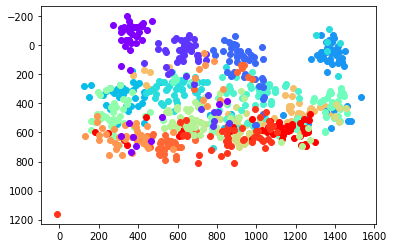

--------------------------------------------------
Recording length :  28.819000
RecStop - RecStart :  28826.0
Frame Count :  864
FPS :  29.980221381727333
start times :  [1719, 3422, 5138, 6855, 8549, 10259, 11975, 13669, 15371, 17077, 18788, 20494, 22203, 23915, 25614, 27330]
stop times :  [3219, 4928, 6638, 8344, 10046, 11761, 13464, 15168, 16872, 18580, 20286, 21998, 23700, 25408, 27118, 28830]
diff :  [1500, 1506, 1500, 1489, 1497, 1502, 1489, 1499, 1501, 1503, 1498, 1504, 1497, 1493, 1504, 1500]


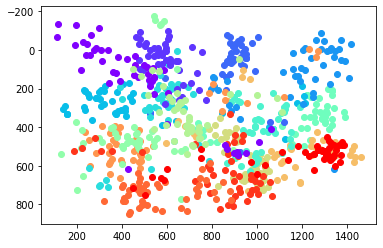

--------------------------------------------------
Recording length :  28.870000
RecStop - RecStart :  28867.0
Frame Count :  866
FPS :  29.996536196744024
start times :  [1718, 3442, 5152, 6868, 8561, 10279, 11996, 13711, 15414, 17120, 18815, 20524, 22244, 23949, 25648, 27358]
stop times :  [3226, 4941, 6652, 8356, 10068, 11782, 13494, 15201, 16908, 18609, 20321, 22027, 23743, 25446, 27155, 28870]
diff :  [1508, 1499, 1500, 1488, 1507, 1503, 1498, 1490, 1494, 1489, 1506, 1503, 1499, 1497, 1507, 1512]


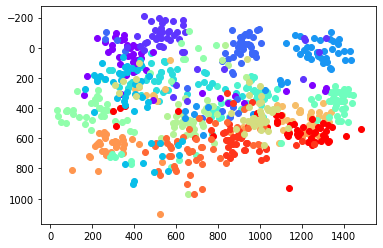

--------------------------------------------------
Recording length :  28.787000
RecStop - RecStart :  28790.0
Frame Count :  863
FPS :  29.97880987945948
start times :  [1724, 3432, 5115, 6831, 8518, 10233, 11935, 13638, 15340, 17045, 18779, 20497, 22198, 23902, 25587, 27294]
stop times :  [3208, 4911, 6613, 8314, 10015, 11718, 13422, 15123, 16839, 18564, 20280, 21981, 23683, 25384, 27088, 28793]
diff :  [1484, 1479, 1498, 1483, 1497, 1485, 1487, 1485, 1499, 1519, 1501, 1484, 1485, 1482, 1501, 1499]


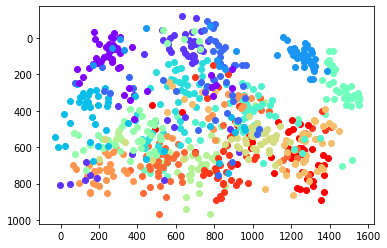

--------------------------------------------------
Recording length :  28.834000
RecStop - RecStart :  28827.0
Frame Count :  865
FPS :  29.99930637441909
start times :  [1731, 3429, 5143, 6849, 8562, 10274, 11988, 13691, 15389, 17105, 18804, 20516, 22221, 23917, 25632, 27327]
stop times :  [3216, 4931, 6638, 8350, 10061, 11771, 13481, 15182, 16889, 18591, 20300, 22003, 23713, 25420, 27123, 28830]
diff :  [1485, 1502, 1495, 1501, 1499, 1497, 1493, 1491, 1500, 1486, 1496, 1487, 1492, 1503, 1491, 1503]


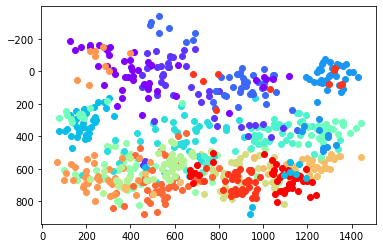

--------------------------------------------------
Recording length :  28.833000
RecStop - RecStart :  28825.0
Frame Count :  865
FPS :  30.000346824818784
start times :  [1719, 3426, 5130, 6831, 8530, 10246, 11951, 13665, 15367, 17080, 18788, 20485, 22203, 23910, 25614, 27315]
stop times :  [3214, 4920, 6621, 8327, 10033, 11738, 13449, 15152, 16868, 18580, 20281, 21995, 23697, 25408, 27113, 28828]
diff :  [1495, 1494, 1491, 1496, 1503, 1492, 1498, 1487, 1501, 1500, 1493, 1510, 1494, 1498, 1499, 1513]


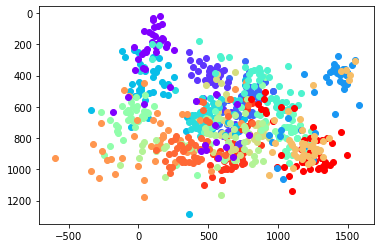

--------------------------------------------------
Recording length :  28.757000
RecStop - RecStart :  28767.0
Frame Count :  862
FPS :  29.975310359216884
start times :  [1731, 3449, 5151, 6853, 8541, 10242, 11961, 13649, 15366, 17067, 18769, 20462, 22173, 23877, 25578, 27266]
stop times :  [3231, 4933, 6635, 8339, 10039, 11743, 13445, 15147, 16849, 18551, 20255, 21957, 23659, 25360, 27062, 28770]
diff :  [1500, 1484, 1484, 1486, 1498, 1501, 1484, 1498, 1483, 1484, 1486, 1495, 1486, 1483, 1484, 1504]


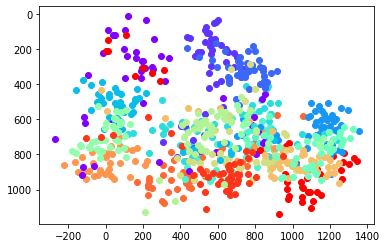

--------------------------------------------------
Recording length :  28.806000
RecStop - RecStart :  28813.0
Frame Count :  864
FPS :  29.99375130181212
start times :  [1733, 3448, 5150, 6854, 8572, 10275, 11976, 13693, 15410, 17112, 18801, 20519, 22209, 23923, 25609, 27311]
stop times :  [3231, 4936, 6651, 8354, 10057, 11773, 13490, 15194, 16895, 18598, 20302, 22004, 23704, 25407, 27108, 28816]
diff :  [1498, 1488, 1501, 1500, 1485, 1498, 1514, 1501, 1485, 1486, 1501, 1485, 1495, 1484, 1499, 1505]


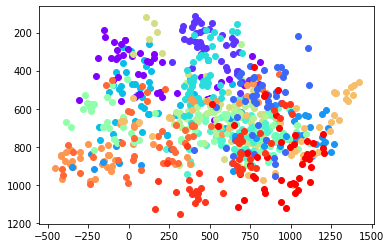

--------------------------------------------------
Recording length :  28.792000
RecStop - RecStart :  28804.0
Frame Count :  864
FPS :  30.00833564879133
start times :  [1719, 3447, 5148, 6842, 8559, 10275, 11962, 13680, 15371, 17071, 18771, 20490, 22183, 23893, 25598, 27301]
stop times :  [3229, 4931, 6635, 8339, 10055, 11757, 13460, 15163, 16865, 18567, 20273, 21974, 23680, 25394, 27097, 28811]
diff :  [1510, 1484, 1487, 1497, 1496, 1482, 1498, 1483, 1494, 1496, 1502, 1484, 1497, 1501, 1499, 1510]


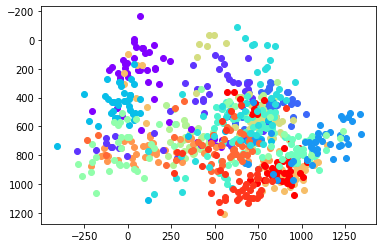

--------------------------------------------------
Recording length :  28.852000
RecStop - RecStart :  28837.0
Frame Count :  865
FPS :  29.980590600305003
start times :  [1730, 3437, 5146, 6850, 8554, 10260, 11961, 13683, 15383, 17091, 18802, 20506, 22207, 23930, 25631, 27348]
stop times :  [3225, 4941, 6643, 8345, 10049, 11754, 13466, 15170, 16880, 18587, 20297, 22006, 23714, 25428, 27132, 28840]
diff :  [1495, 1504, 1497, 1495, 1495, 1494, 1505, 1487, 1497, 1496, 1495, 1500, 1507, 1498, 1501, 1492]


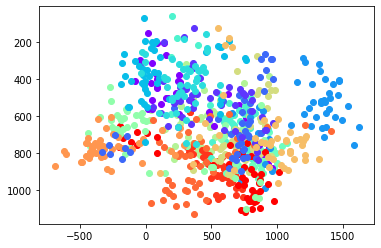

--------------------------------------------------


In [728]:
trial_x,trial_y = zone_analyze.parse_trials(pred_path.MPII)

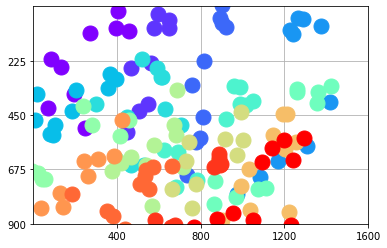

In [524]:
pallete = iter(cm.rainbow(np.linspace(0, 1, 16)))
preds = np.zeros((16,16))
plot_zone((4,4))
for zone in range(1,17):
    c=0
    color = next(pallete)
    for trial in range(10):
#         if get_zone(trial_x[zone][trial],trial_y[zone][trial], (4,4)) == zone-1:
        preds[zone-1,get_zone(trial_x[zone][trial],trial_y[zone][trial], (4,4))] += 1
        plt.plot(trial_x[zone][trial],trial_y[zone][trial],marker="o", markersize = 15,color = color)
#     plt.show()
#     print("Zone {} : {}/10".format(zone,c))
    
# print("Avg: ",avg/160)

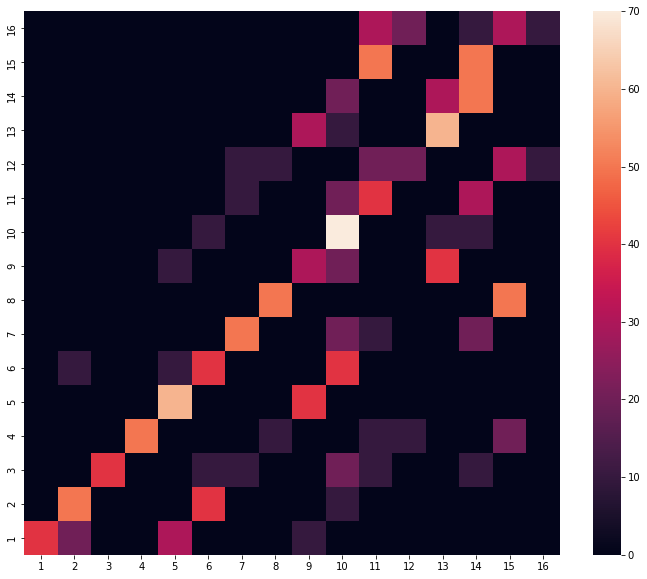

In [525]:
import seaborn as sns
plt.figure(figsize=(12,10))
sns.heatmap(preds*10, xticklabels=range(1,17), yticklabels=range(1,17))
plt.gca().invert_yaxis()

In [526]:
from sklearn import metrics
zone_pred = np.argmax(preds,axis=1)+1
metrics.accuracy_score(np.arange(1,17),zone_pred)*100

75.0

accuracy: 9/16 = 56.25%


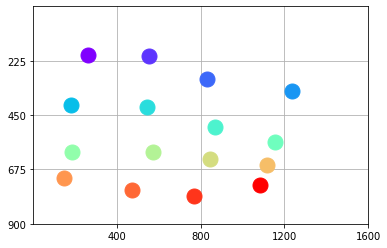

In [527]:
pallete = iter(cm.rainbow(np.linspace(0, 1, 16)))
c=0
plot_zone((4,4))
for z in range(1,17):
    av_x = statistics.mean(trial_x[z])
    av_y = statistics.mean(trial_y[z])
    plt.plot(av_x, av_y, marker="o", markersize = 15, color = next(pallete))
    if get_zone(av_x,av_y, (4,4)) == z-1:
        c+=1
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

accuracy: 13/16 = 81.25%


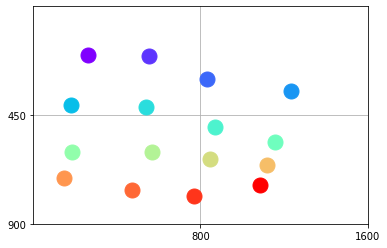

In [528]:
pallete = iter(cm.rainbow(np.linspace(0, 1, 16)))
c=0
gt = {0:[1,2,5,6],1:[3,4,7,8],2:[9,10,13,14],3:[11,12,15,16]}
plot_zone((2,2))
for z in range(1,17):
    av_x = statistics.mean(trial_x[z])
    av_y = statistics.mean(trial_y[z])
    plt.plot(av_x, av_y, marker = "o", markersize = 15, color = next(pallete))
    c = c + ( 1 if z in gt[get_zone(av_x,av_y,(2,2))]  else 0 )
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

accuracy: 15/16 = 93.75%


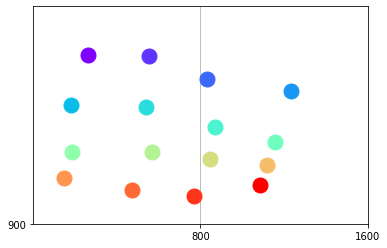

In [529]:
pallete = iter(cm.rainbow(np.linspace(0, 1, 16)))
c=0
gt = {0:[1,2,5,6,9,10,13,14],1:[3,4,7,8,11,12,15,16]}
plot_zone((2,1))
for z in range(1,17):
    av_x = statistics.mean(trial_x[z])
    av_y = statistics.mean(trial_y[z])
    plt.plot(av_x, av_y, marker = "o", markersize = 15, color = next(pallete))
    c = c + ( 1 if z in gt[get_zone(av_x,av_y,(2,1))] else 0 )
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

accuracy: 14/16 = 87.50%


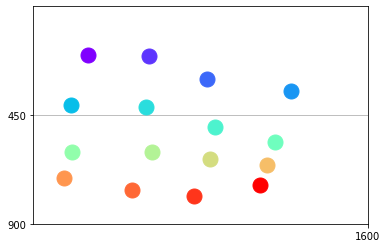

In [530]:
pallete = iter(cm.rainbow(np.linspace(0, 1, 16)))
c=0
gt = {0:[1,2,5,6,3,4,7,8],1:[9,10,13,14,11,12,15,16]}
plot_zone((1,2))
for z in range(1,17):
    av_x = statistics.mean(trial_x[z])
    av_y = statistics.mean(trial_y[z])
    plt.plot(av_x, av_y, marker = "o", markersize = 15, color = next(pallete))
    c = c + ( 1 if z in gt[get_zone(av_x,av_y,(1,2))//2] else 0 )
print("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

# FreeView

In [612]:
# Ref:
# https://github.com/herrlich10/saliency/blob/master/benchmark/utils.py
# https://github.com/cvzoya/saliency/tree/master/code_forMetrics

def normalize(x, method='standard', axis=None):
    '''Normalizes the input with specified method.
    Parameters
    ----------
    x : array-like
    method : string, optional
        Valid values for method are:
        - 'standard': mean=0, std=1
        - 'range': min=0, max=1
        - 'sum': sum=1
    axis : int, optional
        Axis perpendicular to which array is sliced and normalized.
        If None, array is flattened and normalized.
    Returns
    -------
    res : numpy.ndarray
        Normalized array.
    '''
    # TODO: Prevent divided by zero if the map is flat
    x = np.array(x, copy=False)
    if axis is not None:
        y = np.rollaxis(x, axis).reshape([x.shape[axis], -1])
        shape = np.ones(len(x.shape))
        shape[axis] = x.shape[axis]
        if method == 'standard':
            res = (x - np.mean(y, axis=1).reshape(shape)) / np.std(y, axis=1).reshape(shape)
        elif method == 'range':
            res = (x - np.min(y, axis=1).reshape(shape)) / (np.max(y, axis=1) - np.min(y, axis=1)).reshape(shape)
        elif method == 'sum':
            res = x / np.float_(np.sum(y, axis=1).reshape(shape))
        else:
            raise ValueError('method not in {"standard", "range", "sum"}')
    else:
        if method == 'standard':
            res = (x - np.mean(x)) / np.std(x)
        elif method == 'range':
            res = (x - np.min(x)) / (np.max(x) - np.min(x))
        elif method == 'sum':
            res = x / float(np.sum(x))
        else:
            raise ValueError('method not in {"standard", "range", "sum"}')
    return res

def CC(saliency_map1, saliency_map2):
    '''
    Pearson's correlation coefficient between two different saliency maps
    (CC=0 for uncorrelated maps, CC=1 for perfect linear correlation).

    '''
    map1 = np.array(saliency_map1, copy=False)
    map2 = np.array(saliency_map2, copy=False)
    assert map1.shape == map2.shape, "Size of two maps do not match"
    # Normalize the two maps to have zero mean and unit std
    map1 = normalize(map1, method='standard')
    map2 = normalize(map2, method='standard')
    # Compute correlation coefficient
    return np.corrcoef(map1.ravel(), map2.ravel())[0,1]

def SIM(saliency_map1, saliency_map2):
    '''
    Similarity between two different saliency maps when viewed as distributions
    (SIM=1 means the distributions are identical).
    This similarity measure is also called **histogram intersection**.
    '''
    map1 = np.array(saliency_map1, copy=False)
    map2 = np.array(saliency_map2, copy=False)
    assert map1.shape == map2.shape, "Size of two maps do not match"
    # Normalize the two maps to have values between [0,1] and sum up to 1
    map1 = normalize(map1, method='range')
    map2 = normalize(map2, method='range')
    map1 = normalize(map1, method='sum')
    map2 = normalize(map2, method='sum')
    # Compute histogram intersection
    intersection = np.minimum(map1, map2)
    return np.sum(intersection)
 
def AUC_Judd(gray, x, y):
    gray = (gray-gray.min())/(gray.max() - gray.min()) ##normalize
    # fixation_map = gray>0.5
    xpts=pd.concat(x, ignore_index=True).clip(0,gray.shape[1]-1) #clipping to boundary vals
    xpts = xpts - (1600 - img.shape[1])//2 #not generic but since all 16 images are resized on height
    ypts=pd.concat(y, ignore_index=True).clip(0,gray.shape[0]-1)
    fixation_map = np.zeros(gray.shape, dtype = bool)
    fixation_map[ypts,xpts] = True
    fixation_map[[0,0,gray.shape[0]-1,gray.shape[0]-1],[0,gray.shape[1]-1,0,gray.shape[1]-1]] = False #correcting for boundary values
    
    #from MIT saliency metrics Matlab/py (/herrlich10/saliency) implementation
    S = gray.ravel()
    F = fixation_map.ravel()
    S_fix = S[F]
    n_fix = len(S_fix)
    n_pixels = len(S)


    # Calculate AUC
    thresholds = sorted(S_fix, reverse=True)
    tp = np.zeros(len(thresholds)+2)
    fp = np.zeros(len(thresholds)+2)
    tp[0] = 0; tp[-1] = 1
    fp[0] = 0; fp[-1] = 1
    for k, thresh in enumerate(thresholds):
        above_th = np.sum(S >= thresh) # Total number of saliency map values above threshold
        tp[k+1] = (k + 1) / float(n_fix) # Ratio saliency map values at fixation locations above threshold
        fp[k+1] = (above_th - k - 1) / float(n_pixels - n_fix) # Ratio other saliency map values above threshold
    return np.trapz(tp, fp)

def std_2D(x,y):
    x_mean = int(statistics.mean(x))
    y_mean  = int(statistics.mean(y))
    d_mean=[]
    for i,j in zip(x,y):
        d_mean.append(distance.euclidean([x_mean,y_mean],[i,j]))
    return statistics.stdev(d_mean)

In [532]:
import sys
sys.path.append('/hpc/users/shreshth.saxena/Models/blink_Soukuova_and_Check/')
from quick_blinks import get_ear

def labVanced_present(img):
    #LabVanced frame size = (1600,900)
    if (img.shape[1]/img.shape[0]) <= 16/9 : #width/height
        img = imutils.resize(img,height = 900)
        offset = (1600-img.shape[1])//2
        xbounds = (offset,offset+img.shape[1])
        ybounds = (0,900)
    else:
        print("RESIZING ON WIDTH") #debug
        img = imutils.resize(img,width = 1600)
        offset = (900-img.shape[0])//2
        xbounds = (0,1600)
        ybounds = (offset,offset+img.shape[0])
#         temp=(csv-csv.min())/(csv.max()-csv.min())
#         temp["poly_x"] = temp["poly_x"]*1600
#         temp["poly_y"] = temp["poly_y"]*900
    return img,xbounds,ybounds


        

class FreeView():
    def __init__(self, pre, calib_block, show=True):
        
        self.pre = pre
        self.calib_block = calib_block
        self.task = "3. FreeView"
#         self.palette = cm.rainbow(np.linspace(0, 1, 12))
        fnames = ['i05june05_static_street_boston_p1010806',
         'i102423191',
         'i110996888',
         'i1126243635',
         'i1142164052',
         'i1158892521',
         'i117772445',
         'i12030916',
         'i12049788',
         'i132419257',
         'i14020903',
         'i1508828',
         'i2057541',
         'i2234959271',
         'i40576393',
         'i4466881']
        self.image_name = {i:f for i,f in zip(range(1,17),fnames)}
        
    def plot_one_subject(self, trial, trial_x, trial_y, xlim=1600 ,ylim=900  , figsize=(18,9), n=14):
        img_name = self.image_name[trial]
        fig,ax = plt.subplots(figsize=figsize)
        img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
        print("Trial_Id", trial, "image name", img_name)
        img,xbounds, ybounds = labVanced_present(img)
        ax.imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0], ybounds[1]])
        ax.scatter(x=trial_x,y=trial_y)
#         ax.set_xlim(0,xlim)
#         ax.set_ylim(0,ylim)
        return ax
    
    def plot_all_subjects(self, subjects, trials, xlim=1600 ,ylim=900  , figsize=(18,9)):
        
        for trial in trials: #trials = images
            img_name = self.image_name[trial]
            palette = iter(cm.rainbow(np.linspace(0, 1, len(subjects))))
            plt.figure(figsize=figsize)
            img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
            print("Trial_Id", trial, "image name", img_name)
            img,xbounds, ybounds = labVanced_present(img)
            plt.imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0], ybounds[1]])
            for subject in subjects.keys():
                plt.scatter(x=subjects[subject]["trial_x"][trial],y=subjects[subject]["trial_y"][trial])
#             ax.set_xlim(0,xlim)
#             ax.set_ylim(0,ylim)
            plt.gca().invert_yaxis()
            plt.show()
    
    def parse_trials(self, subb, model, show = True, model_outputs = False, analyse_blinks = False):
        
        df = pd.read_csv("Subjects/s"+subb+"/data.csv")
        task_df = df[(df["Task_Name"] == self.task) & (df["Trial_Id"] != 17)]
        
        trial_x = {key:[] for key in range(1,17)}
        trial_y = {key:[] for key in range(1,17)}
        for _,row in task_df.iterrows():
            
            rec_name = row.freeViewRec
            rec_id = row.rec_session_id
            fname = "Subjects/s{}/{}/{}".format(subb,rec_id,rec_name)

            if show:
                vid_len = ffmpeg.probe(fname)["format"]["duration"]
                print("Recording length : ",vid_len)
                print("RecStop - RecStart : ",row.RecStop - row.RecStart)
                if analyse_blinks:
                    temp = get_ear(fname)
                    c = temp.shape[0]
                    temp.plot(x="frame",y="ear", kind ="line")
                else:
                    c = get_frame_count(fname)
                print("Frame Count : ",c)
                print("FPS : ",c/float(vid_len))
                print("file name",fname)
                
            if model_outputs:
                pred_df = pd.read_csv(os.path.join(model.value, "s{}/model_outputs/Block_{}".format(subb,str(row.Block_Nr)),self.task.split(" ")[1]+"{}.csv".format(row.Trial_Id)))
            else:
                if model.name == "FAZE":
                    pred_df = pd.read_csv(os.path.join(model.value, "s{}/pix_to_fu/Block_{}/{task}{trial}.csv".format(subb,str(row.Block_Nr),task = self.task.split(" ")[1], trial = row.Trial_Id)))
                else:
                    pred_df = pd.read_csv(os.path.join(model.value, "s{}/pix_to_fu/{}_preds/{}/Block_{}/{task}{trial}.csv".format(subb,self.pre,self.calib_block,str(row.Block_Nr),task = self.task.split(" ")[1], trial = row.Trial_Id)))
                    
            if show:
                ax = self.plot_one_subject(row["Trial_Id"],pred_df["poly_x"],pred_df["poly_y"])
                plt.gca().invert_yaxis()
                ax.plot()
                plt.show()
            trial_x[row["Trial_Id"]] = pred_df["poly_x"]
            trial_y[row["Trial_Id"]] = pred_df["poly_y"]
        return trial_x, trial_y

Recording length :  2.858000
RecStop - RecStart :  3010.0
Frame Count :  79
FPS :  27.641707487753674
file name Subjects/s10/303783/blockNr_13_taskNr_15_trialNr_2_freeViewRec.webm
Trial_Id 10 image name i132419257


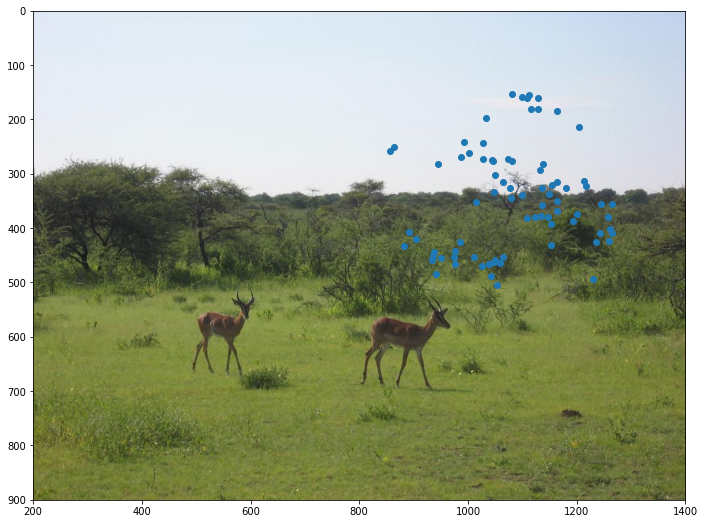

Recording length :  2.838000
RecStop - RecStart :  3012.0
Frame Count :  67
FPS :  23.60817477096547
file name Subjects/s10/303783/blockNr_13_taskNr_15_trialNr_3_freeViewRec.webm
Trial_Id 5 image name i1142164052


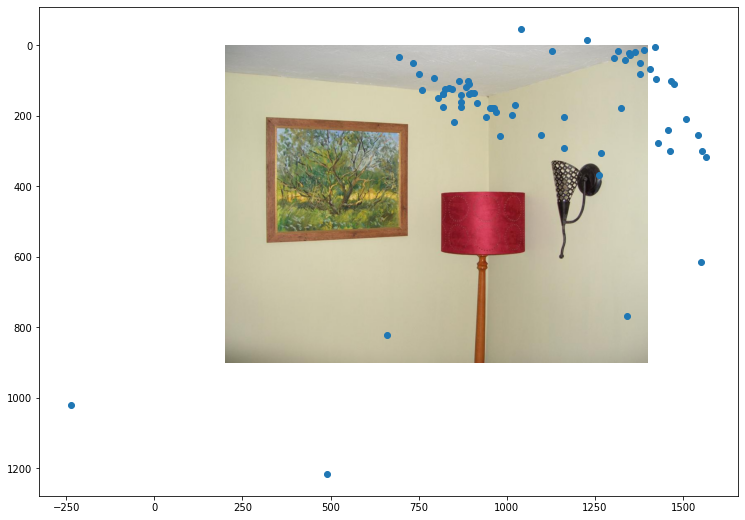

Recording length :  2.884000
RecStop - RecStart :  3013.0
Frame Count :  79
FPS :  27.39251040221914
file name Subjects/s10/303783/blockNr_13_taskNr_15_trialNr_4_freeViewRec.webm
Trial_Id 13 image name i2057541


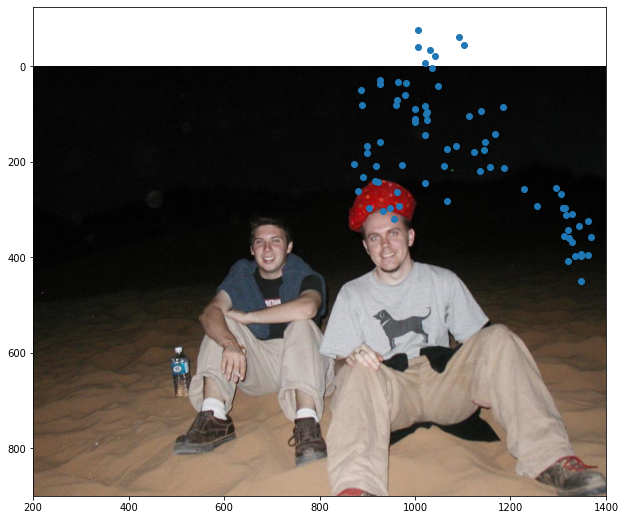

Recording length :  2.845000
RecStop - RecStart :  3014.0
Frame Count :  71
FPS :  24.95606326889279
file name Subjects/s10/303783/blockNr_13_taskNr_15_trialNr_5_freeViewRec.webm
Trial_Id 7 image name i117772445


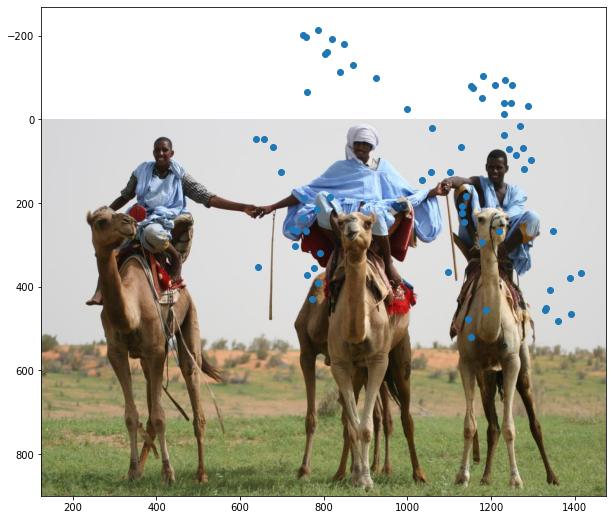

Recording length :  2.869000
RecStop - RecStart :  3007.0
Frame Count :  70
FPS :  24.398745207389332
file name Subjects/s10/303783/blockNr_13_taskNr_15_trialNr_6_freeViewRec.webm
Trial_Id 4 image name i1126243635


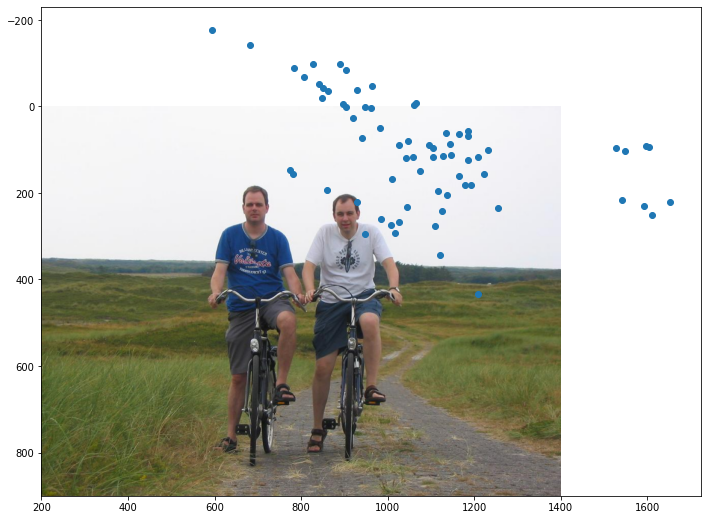

Recording length :  2.803000
RecStop - RecStart :  3006.0
Frame Count :  66
FPS :  23.54620049946486
file name Subjects/s10/303783/blockNr_13_taskNr_15_trialNr_7_freeViewRec.webm
Trial_Id 2 image name i102423191


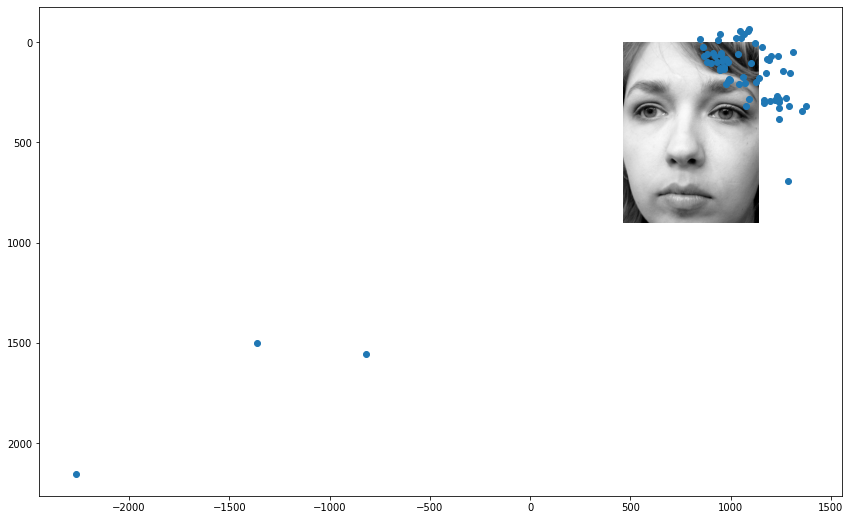

Recording length :  2.916000
RecStop - RecStart :  3008.0
Frame Count :  84
FPS :  28.80658436213992
file name Subjects/s10/303783/blockNr_13_taskNr_15_trialNr_8_freeViewRec.webm
Trial_Id 11 image name i14020903


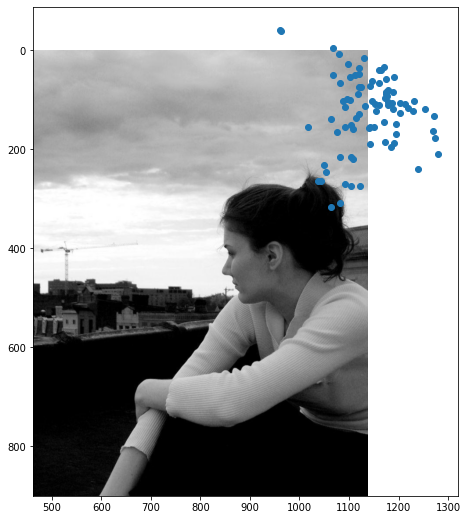

Recording length :  2.835000
RecStop - RecStart :  3006.0
Frame Count :  63
FPS :  22.22222222222222
file name Subjects/s10/303783/blockNr_13_taskNr_15_trialNr_9_freeViewRec.webm
Trial_Id 14 image name i2234959271


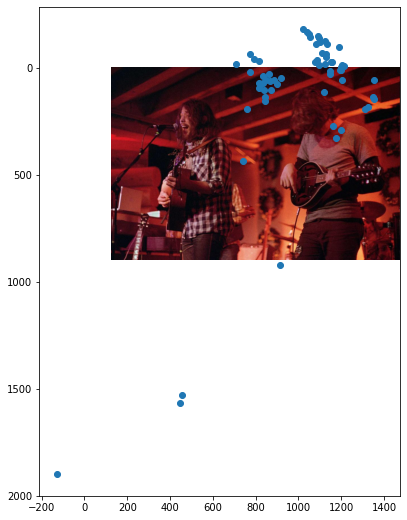

Recording length :  2.950000
RecStop - RecStart :  3013.0
Frame Count :  75
FPS :  25.423728813559322
file name Subjects/s10/303783/blockNr_6_taskNr_15_trialNr_2_freeViewRec.webm
Trial_Id 9 image name i12049788


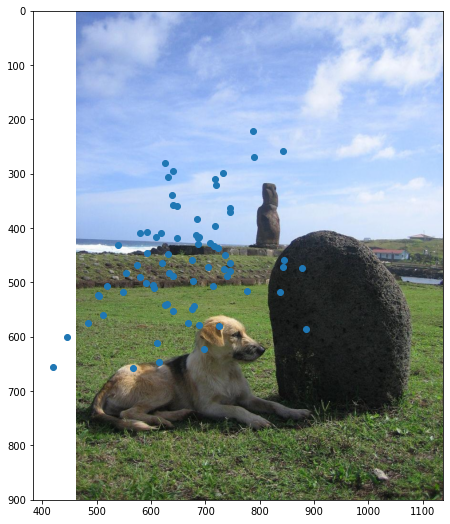

Recording length :  2.915000
RecStop - RecStart :  3006.0
Frame Count :  87
FPS :  29.845626072041167
file name Subjects/s10/303783/blockNr_6_taskNr_15_trialNr_3_freeViewRec.webm
Trial_Id 8 image name i12030916


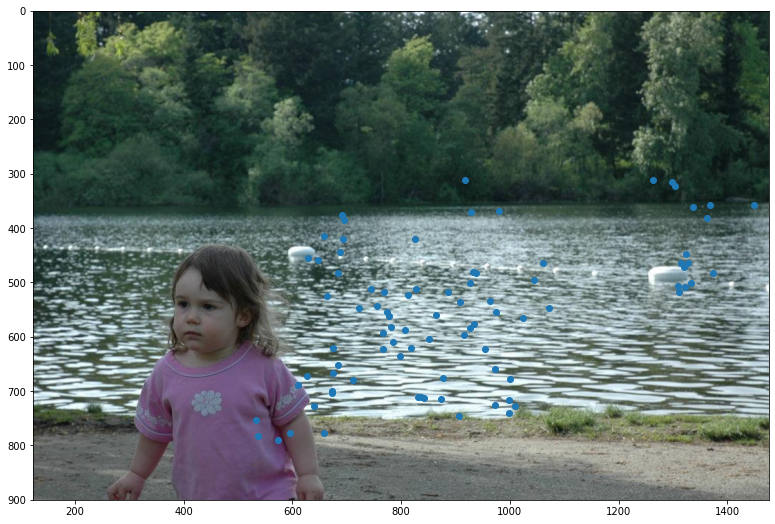

Recording length :  2.712000
RecStop - RecStart :  3019.0
Frame Count :  69
FPS :  25.442477876106192
file name Subjects/s10/303783/blockNr_6_taskNr_15_trialNr_4_freeViewRec.webm
Trial_Id 3 image name i110996888


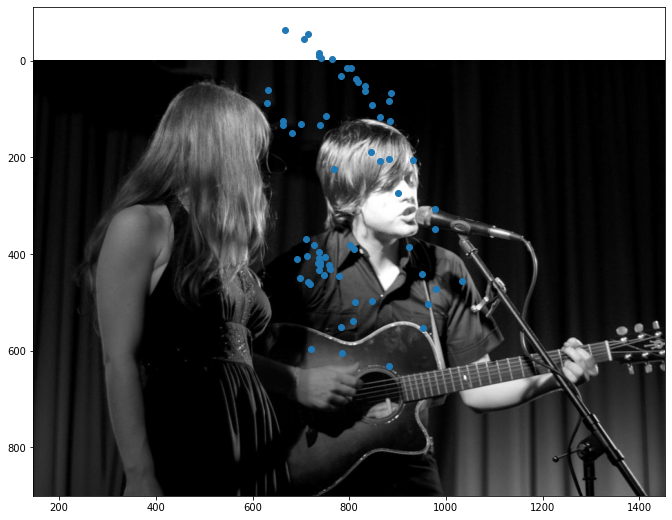

Recording length :  2.799000
RecStop - RecStart :  3020.0
Frame Count :  83
FPS :  29.65344765987853
file name Subjects/s10/303783/blockNr_6_taskNr_15_trialNr_5_freeViewRec.webm
Trial_Id 6 image name i1158892521


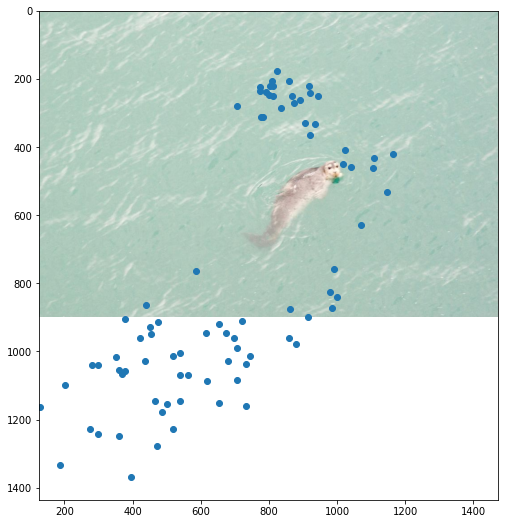

Recording length :  2.876000
RecStop - RecStart :  3010.0
Frame Count :  82
FPS :  28.51182197496523
file name Subjects/s10/303783/blockNr_6_taskNr_15_trialNr_6_freeViewRec.webm
Trial_Id 1 image name i05june05_static_street_boston_p1010806


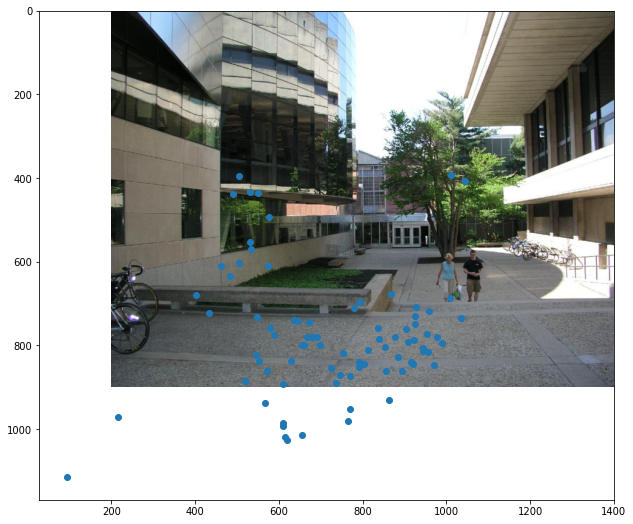

Recording length :  2.844000
RecStop - RecStart :  3008.0
Frame Count :  80
FPS :  28.129395218002813
file name Subjects/s10/303783/blockNr_6_taskNr_15_trialNr_7_freeViewRec.webm
Trial_Id 16 image name i4466881


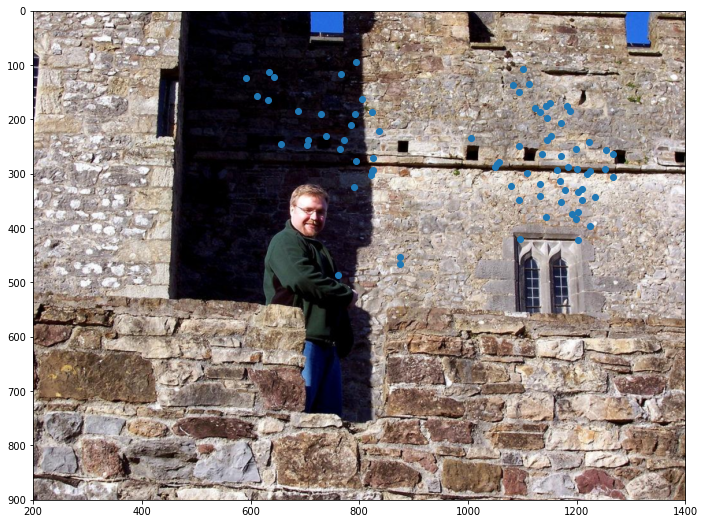

Recording length :  2.836000
RecStop - RecStart :  3013.0
Frame Count :  71
FPS :  25.035260930888576
file name Subjects/s10/303783/blockNr_6_taskNr_15_trialNr_8_freeViewRec.webm
Trial_Id 15 image name i40576393


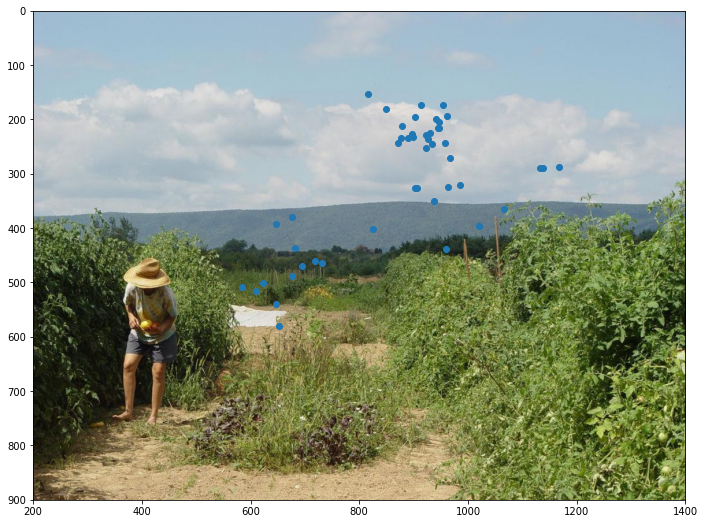

Recording length :  2.805000
RecStop - RecStart :  3008.0
Frame Count :  77
FPS :  27.45098039215686
file name Subjects/s10/303783/blockNr_6_taskNr_15_trialNr_9_freeViewRec.webm
Trial_Id 12 image name i1508828


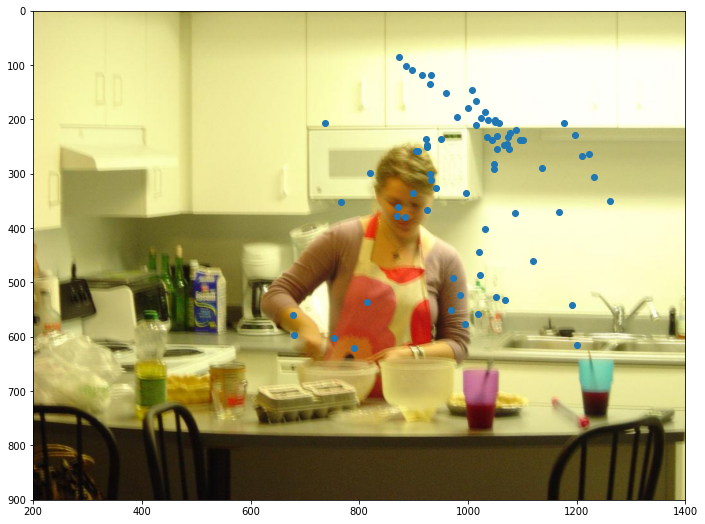

In [730]:
FV_analyse = FreeView( "E", "Mid", show=False)
trial_x, trial_y = FV_analyse.parse_trials("10", pred_path.ETH, analyse_blinks=False)

In [535]:
subjects = {key: {} for key in [str(i) for i in range(8,12)]}

FV_analyse = FreeView("E", "Beg", show=False)
for subject in subjects.keys():
    trial_x, trial_y = FV_analyse.parse_trials(subject, pred_path.FAZE, show = False)
    subjects[subject]["trial_x"] = trial_x
    subjects[subject]["trial_y"] = trial_y

Trial_Id 2 image name i102423191


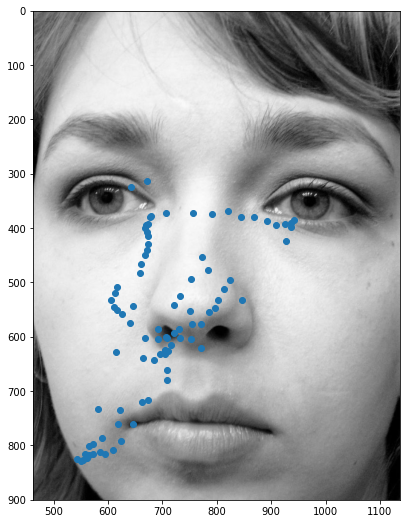

In [536]:
FV_analyse.plot_one_subject(2,subjects["8"]["trial_x"][2],subjects["8"]["trial_y"][2])
plt.gca().invert_yaxis()

Trial_Id 1 image name i05june05_static_street_boston_p1010806


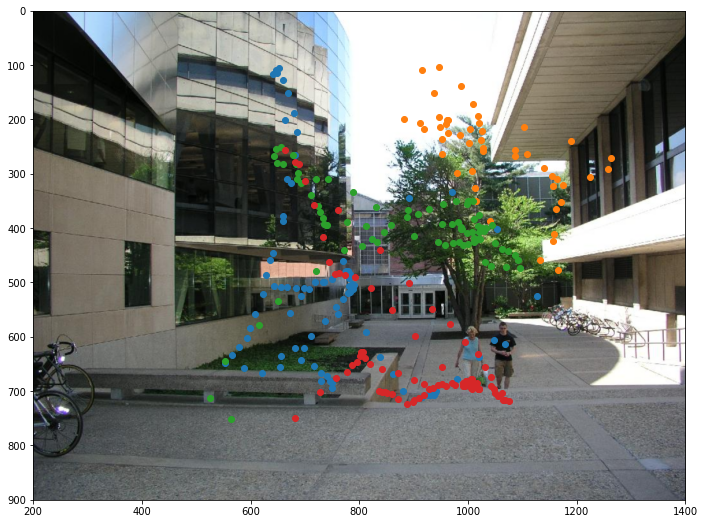

In [538]:
FV_analyse.plot_all_subjects(subjects, [i for i in range(1,2)]) #2nd arg image_ids

In [613]:
import scipy
def KDE_plot(x,y):
    #adjust data range if needed
    xd = x
    yd = y

    values = np.vstack([xd,yd])
    kernel = scipy.stats.gaussian_kde(values, bw_method = 54/std_2D(x,y))

    xi, yi = np.mgrid[0:1600:1600j,0:900:900j]
    # xi,yi = np.mgrid[xd.min():xd.max():(xd.max()-xd.min())*1j, yd.min():yd.max():(yd.max() - yd.min())*1j]
    zi = kernel(np.vstack([xi.ravel(), yi.ravel()]))
    Z = np.reshape(zi.T, xi.shape)
    
    return np.flip(np.rot90(Z),0)

# plt.figure(figsize=(10,6))
# plt.scatter(x,y)
# Z = KDE_plot(x,y)
# plt.imshow(Z, cmap = plt.cm.gist_earth_r)#, extent = [x.min(),x.max(),y.min(),y.max()])

# plt.xlim(0,1600)
# plt.ylim(0,900)
# plt.gca().invert_yaxis()

Trial_Id 1 image name i05june05_static_street_boston_p1010806
AUC       0.46313427181458
CC        0.38177413685647216
SIM       0.3593437454229118


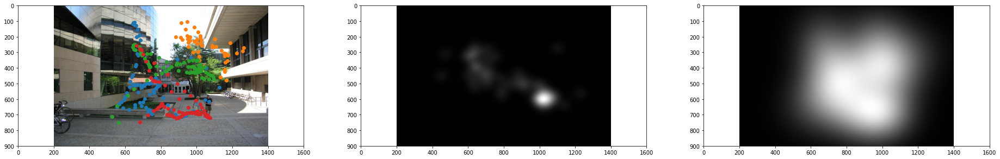

Trial_Id 2 image name i102423191
AUC       0.2439521619212951
CC        0.34330495965704355
SIM       0.345601841832156


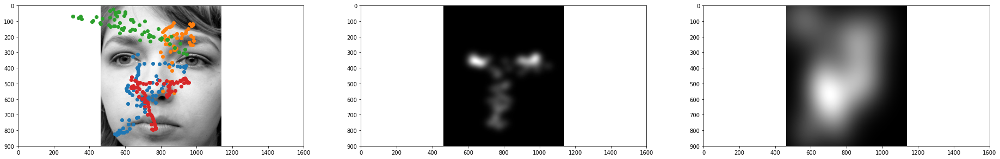

Trial_Id 3 image name i110996888
AUC       0.8277099305446902
CC        0.5102422438935893
SIM       0.42123128451065084


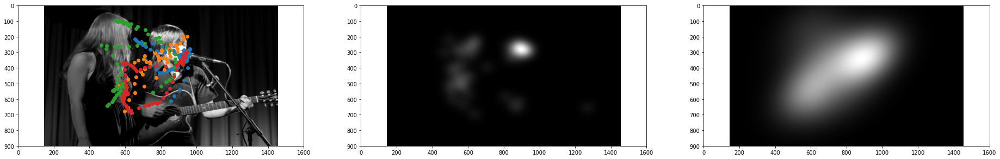

Trial_Id 4 image name i1126243635
AUC       0.5364486188990399
CC        0.5421779404646587
SIM       0.41329810989576


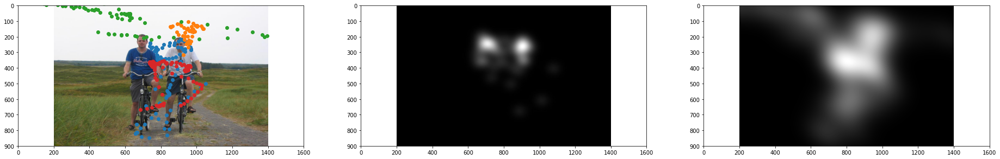

Trial_Id 5 image name i1142164052
AUC       0.536845823272803
CC        0.41913425804464566
SIM       0.34137989088460163


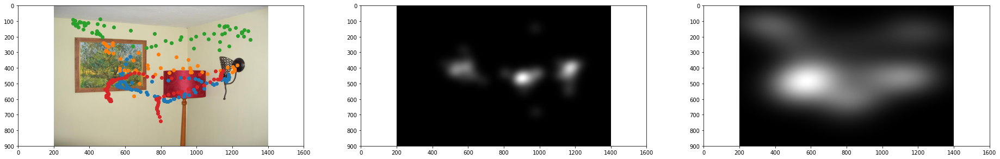

Trial_Id 6 image name i1158892521
AUC       0.6220263866103615
CC        0.3198318843270747
SIM       0.3401789916086836


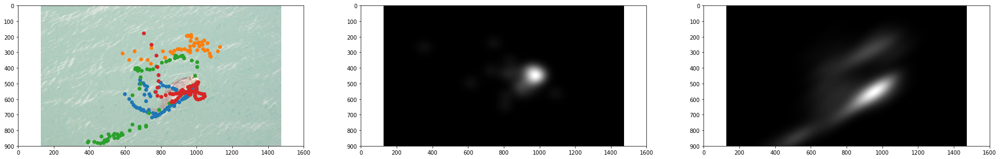

Trial_Id 7 image name i117772445
AUC       0.5384751299285249
CC        0.41237564431969226
SIM       0.392261843066411


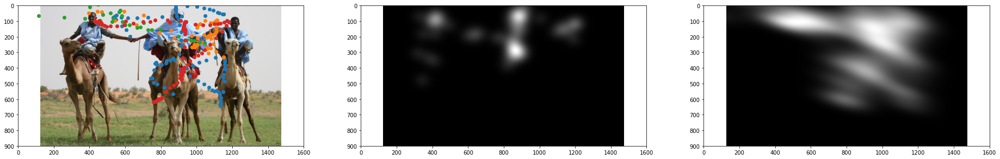

Trial_Id 8 image name i12030916
AUC       0.5890739653429226
CC        0.32429589053378416
SIM       0.3420465864291356


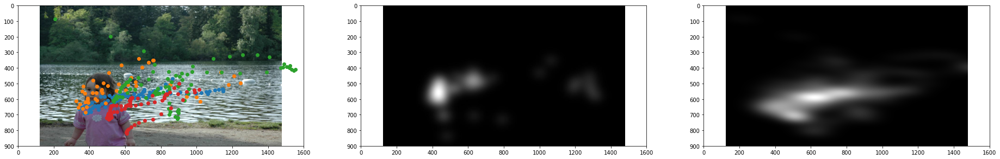

Trial_Id 9 image name i12049788
AUC       0.5697929757684929
CC        0.49173051752277197
SIM       0.44990768342498755


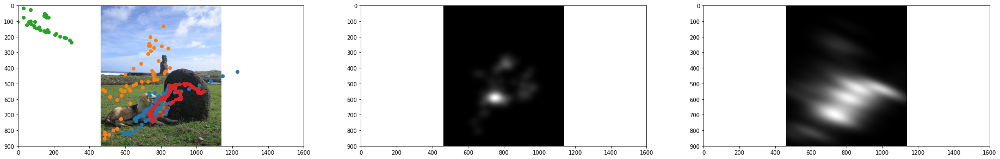

Trial_Id 10 image name i132419257
AUC       0.1816553756107369
CC        0.22610850489008785
SIM       0.2540421120334519


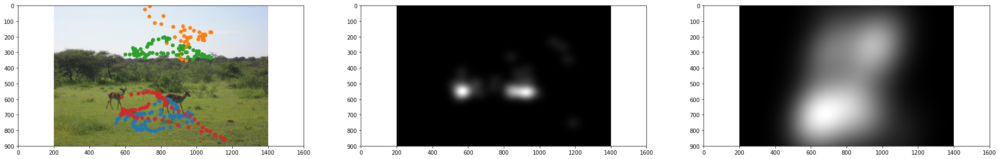

Trial_Id 11 image name i14020903
AUC       0.3061163803593233
CC        0.28507981636235674
SIM       0.28393930121828437


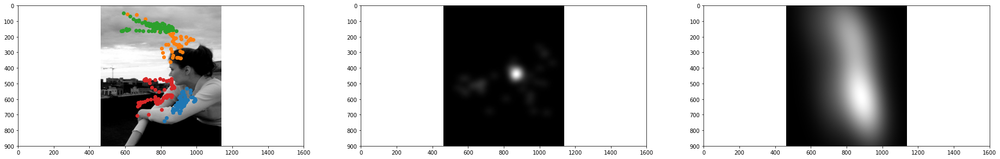

Trial_Id 12 image name i1508828
AUC       0.5547610662217324
CC        0.4470945603360468
SIM       0.4011587755191677


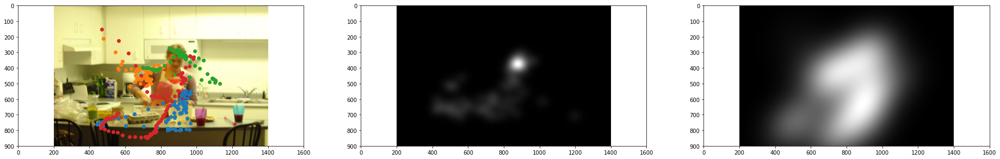

Trial_Id 13 image name i2057541
AUC       0.5201202894635449
CC        0.37532010554682543
SIM       0.3312583131508387


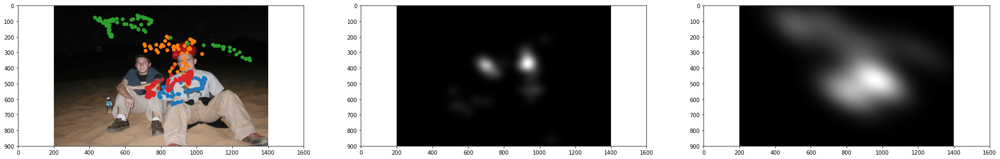

Trial_Id 14 image name i2234959271
AUC       0.42418250392635787
CC        0.31795760301135706
SIM       0.3255153070372529


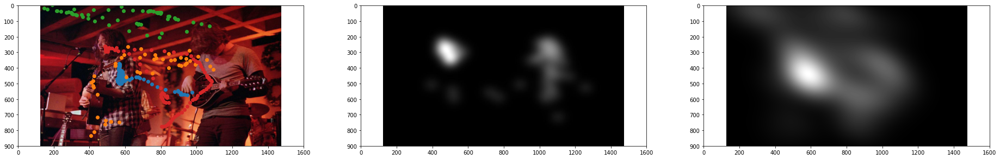

Trial_Id 15 image name i40576393
AUC       0.5773470837118873
CC        0.3778491834563157
SIM       0.39607757639127017


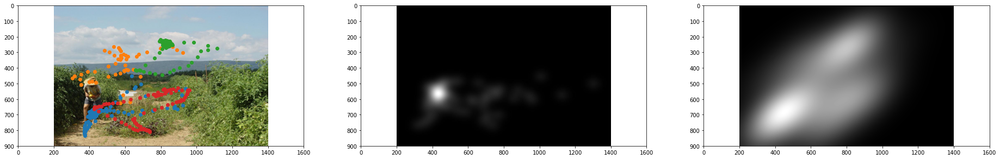

Trial_Id 16 image name i4466881
AUC       0.3649412799851811
CC        0.2021294967893425
SIM       0.24628729523300966


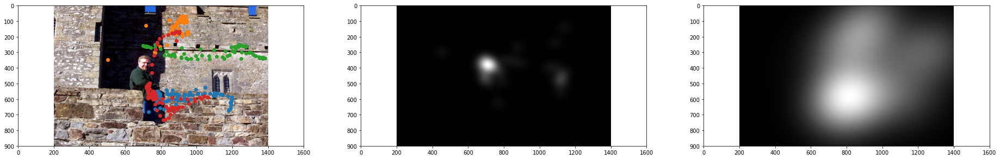

In [615]:

for trial in range(1,17):
    fig,ax = plt.subplots(1,3, figsize=(32,18))
    img_name = FV_analyse.image_name[trial]
    palette = iter(cm.rainbow(np.linspace(0, 1, len(subjects))))
    print("Trial_Id", trial, "image name", img_name)
    
    img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
    img,xbounds,ybounds = labVanced_present(img)
    ax[0].imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])
    x = [ subjects[i]["trial_x"][trial] for i in subjects.keys() ]
    y = [ subjects[i]["trial_y"][trial] for i in subjects.keys() ] 
    for pts_x,pts_y in zip(x,y):
        ax[0].scatter(x=pts_x,y=pts_y)

    gt_heatmap = cv2.imread(
        "FreeView_maps/"+img_name+"_fixMap.jpg", cv2.IMREAD_GRAYSCALE)
    gt_heatmap = imutils.resize(gt_heatmap,height = 900, inter=cv2.INTER_CUBIC) #bi-cubic/nearest is what Matlab imresize() does by default
    ax[1].imshow(gt_heatmap,cmap = plt.get_cmap("gist_gray"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
    
    #KDE
    Z = KDE_plot(x=pd.concat(x, ignore_index=True), y=pd.concat(y, ignore_index=True))
    kde_heatmap = Z[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]]
    ax[2].imshow(kde_heatmap,cmap = plt.get_cmap("gist_gray"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
#     ax[2] = sns.kdeplot(x=pd.concat(x, ignore_index=True), y=pd.concat(y, ignore_index=True), cmap="gray", shade=True, thresh=0.5, fill = True, clip=[xbounds, ybounds])
    
    print("{:10}{}".format("AUC",AUC_Judd(gt_heatmap,x,y)))
    print("{:10}{}".format("CC",CC(gt_heatmap, kde_heatmap)))
    print("{:10}{}".format("SIM",SIM(gt_heatmap, kde_heatmap)))
    
    for i in range(3):
        ax[i].set_xlim(0,1600)
        ax[i].set_ylim(0,900)
        ax[i].invert_yaxis()
        ax[i].set_aspect(14/16)
#     plt.gca().invert_yaxis()
    plt.show()
    
# ax.set_frame_on(False)
# # fig.savefig('kde.png', transparent=True, bbox_inches='tight', pad_inches=0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


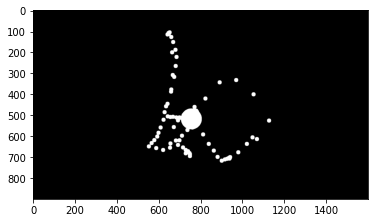

113.0830833634042


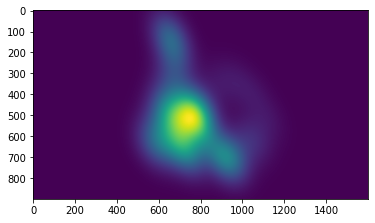

In [609]:
#tEST POC
# from scipy.spatial import distance
# temp = np.zeros((900,1600,3))
# x_mean = int(statistics.mean(x[0]))
# y_mean  = int(statistics.mean(y[0]))
# d_mean=[]
# for i,j in zip(x[0],y[0]):
# #     temp[j,i] == 1
#     temp = cv2.circle(temp,center=(i,j),radius=10,color=[255,255,255],thickness=-1)
#     d_mean.append(distance.euclidean([x_mean,y_mean],[i,j]))

# temp = cv2.circle(temp,center=(x_mean,y_mean),radius=50,color=[255,120,120],thickness=-1)
# plt.imshow(temp, cmap = "Greys")
# plt.show()

# #std
# std_d = statistics.stdev(d_mean)
# print(std_d)

# values = np.vstack([x[0],y[0]])
# kernel = scipy.stats.gaussian_kde(values, bw_method = 54.04/std_d)

# xi, yi = np.mgrid[0:1600:1600j,0:900:900j]
# # xi,yi = np.mgrid[xd.min():xd.max():(xd.max()-xd.min())*1j, yd.min():yd.max():(yd.max() - yd.min())*1j]
# zi = kernel(np.vstack([xi.ravel(), yi.ravel()]))
# Z = np.reshape(zi.T, xi.shape)

# plt.imshow(np.flip(np.rot90(Z),0))

# Blinks

In [677]:
import ffmpeg   
from scipy.signal import find_peaks, peak_prominences
pd.options.plotting.backend = "matplotlib"

class Blink_Detect():
    def __init__(self, subb, show=True):
        
        self.subb = subb
        self.df = pd.read_csv("Subjects/s"+subb+"/data.csv")
        self.task_df = self.df[self.df["Task_Name"] == "5. Blink Detect"]
        self.palette = cm.rainbow(np.linspace(0, 1, 12))
        if show:
            print("blinks_df summary \n {}".format(self.summary()))

    def summary(self):
        print(self.task_df.iloc[0].dropna()[5:17])
    
    def get_preds(self, model):
        trial_probs = {key:[] for key in range(1,11)}
        for _,row in self.task_df.iterrows():
            rec_name = row.BlinkRec
            pred_df = pd.read_csv(os.path.join(model.value, "s{}/{}.csv".format(self.subb,rec_name[:-5]))) 
            trial_probs[row.Trial_Id + (5 if row.Block_Nr == 13 else 0)] = pred_df.iloc[:,-1]
        return trial_probs
    
    def parse_trials(self, model, show = True):
        
        trial_peaks = {key:[] for key in range(1,11)}
        
        for _,row in self.task_df.iterrows():
            rec_name = row.BlinkRec
            rec_id = row.rec_session_id
            fname = "Subjects/s{}/{}/{}".format(self.subb,rec_id,rec_name)

            start_times = row.beep_times.split("---values=")[1].strip("\"").split(";")
            start_times = [int(t) - int(row.RecStart) for t in start_times if len(t)>1]
            
            stop_times = row.beepEndTimes.split("---values=")[1].strip("\"").split(";")
            stop_times = [int(t) - int(row.RecStart) for t in stop_times if len(t)>1]
            
            pred_df = pd.read_csv(os.path.join(model.value, "s{}/{}.csv".format(self.subb,rec_name[:-5]))) 
            
            if pred_df[pred_df.iloc[:,-1] == "NA"].shape[0] > 0.3*pred_df.shape[0]:
                print("> 30% missing data")
                continue
            
            disp_df = pred_df.replace("NA",np.nan).interpolate(method='linear') #try other Interpolation methods?
            med = statistics.median(disp_df.iloc[:,-1])
            print("median:",med)
            
            #threshold conf = 50% and distance between 2 consecutive blinks = 3 frames ~ 3*33 = 99ms since typical blink duration is btw 0.1 to 0.4 s (Ehinger battery paper)
            if model.name == "EAR":
                peaks, _ = find_peaks(-disp_df.iloc[:,-1].to_numpy(), threshold = -1.5*med, distance = 35)
            elif model.name == "RT_BENE":
                peaks, _ = find_peaks(disp_df.iloc[:,-1].to_numpy(), height = 5*med, distance = 35) 
            
            if show:
                vid_len = ffmpeg.probe(fname)["format"]["duration"]
                print("Recording Name : ",rec_name)
                print("Recording length : ",vid_len)
                print("RecStop - RecStart : ",row.RecStop - row.RecStart)
                c = get_frame_count(fname)
                print("Frame Count : ",c)
                print("FPS : ",c/float(vid_len))
                print("start times : ",start_times)
                print("stop times : ",stop_times)
                print("diff : ", [int(i)-int(j) for i,j in zip(start_times, [0]+stop_times[:-1])]) 
                disp_df.plot(x="frame", y=disp_df.columns[-1], figsize=(12,8))
                ymin,ymax = plt.gca().get_ylim()
                plt.vlines(time_to_frame(start_times, fname),ymin,ymax, linestyles ='dashed', colors = 'gray')
                plt.plot(peaks, disp_df.iloc[:,-1][peaks], "x", markersize = 10)
                plt.show()
                print("-"*50)
            
            trial_peaks[row.Trial_Id + (5 if row.Block_Nr == 13 else 0)] = peaks
            
        return trial_peaks
    
    def parse_trials_stack(self, model, show = True):
        trial_latency= {key:[] for key in range(1,11)}
        
        for _,row in self.task_df.iterrows():
            rec_name = row.BlinkRec
            rec_id = row.rec_session_id
            fname = "Subjects/s{}/{}/{}".format(self.subb,rec_id,rec_name)

            start_times = row.beep_times.split("---values=")[1].strip("\"").split(";")
            start_times = [int(t) - int(row.RecStart) for t in start_times if len(t)>1]
            
            intervals = [int(i)-int(j) for i,j in zip(start_times[1:], start_times[:-1])]
            
#             stop_times = row.beepEndTimes.split("---values=")[1].strip("\"").split(";")
#             stop_times = [int(t) - int(row.RecStart) for t in stop_times if len(t)>1]
            
            pred_df = pd.read_csv(os.path.join(model.value, "s{}/{}.csv".format(self.subb,rec_name[:-5]))) 
            
            if pred_df[pred_df.iloc[:,-1] == "NA"].shape[0] > 0.3*pred_df.shape[0]:
                print("> 30% missing data")
                continue
            
            disp_df = pred_df.replace("NA",np.nan).interpolate(method='linear') #try other Interpolation methods?
#             med = statistics.median(disp_df.iloc[:,-1])
#             print("median:",med)
            
            #threshold conf = 50% and distance between 2 consecutive blinks = 3 frames ~ 3*33 = 99ms since typical blink duration is btw 0.1 to 0.4 s (Ehinger battery paper)
#             if model.name == "EAR":
#                 peaks, _ = find_peaks(-disp_df.iloc[:,-1].to_numpy(), threshold = -1.5*med, distance = 35)
#             elif model.name == "RT_BENE":
#                 peaks, _ = find_peaks(disp_df.iloc[:,-1].to_numpy(), height = 5*med, distance = 35) 
            out = thresholding_algo(disp_df.iloc[:,-1].to_numpy(), 40, 4, 0)
            signals = np.pad(out["signals"][40:],(40,0),constant_values=0)
            onsets = time_to_frame(start_times, fname)
            assert len(signals) == disp_df.shape[0]
            
            latency=[]
            mean_interval = time_to_frame([statistics.mean(intervals)],fname)[0]
            print("mean int",mean_interval)
            for i,j in zip(onsets,(onsets[1:]+[onsets[-1]+mean_interval])):
                if -1 in signals[i:j]:
                    latency.append(np.where(signals[i:j]==-1)[0][0])
                else:
                    latency.append(np.nan)
            print("LATENCY",latency)
                           
            if show:
                vid_len = ffmpeg.probe(fname)["format"]["duration"]
                print("Recording Name : ",rec_name)
                print("Recording length : ",vid_len)
                print("RecStop - RecStart : ",row.RecStop - row.RecStart)
                c = get_frame_count(fname)
                print("Frame Count : ",c)
                print("FPS : ",c/float(vid_len))
                print("start times : ",start_times)
#                 print("stop times : ",stop_times)
                print("inter-beat duration : ", intervals) 
                print("Latency: ",latency)
                disp_df.plot(x="frame", y=disp_df.columns[-1], figsize=(12,8))
                ymin,ymax = plt.gca().get_ylim()
                plt.vlines(time_to_frame(start_times, fname),ymin,ymax, linestyles ='dashed', colors = 'gray')
                plt.show()
                plt.figure(figsize=(12,7))
                plt.plot(signals)
                plt.show()
                print("-"*50)
            
            trial_latency[row.Trial_Id + (5 if row.Block_Nr == 13 else 0)] = np.array(latency)
            
        return trial_latency

In [678]:
blink_analyse = Blink_Detect("8")

Trial_Id                                                        5
beep_times      "times=1630506950363;1630506951800;16305069537...
beepEndTimes    "times=1630506950363;1630506952331;16305069540...
BlinkRec             blockNr_13_taskNr_15_trialNr_1_BlinkRec.webm
Condition_Id                                                    1
FrameEnd                                          1630506964584.0
FrameStart                                        1630506950366.0
iter            "times=1630506950363;1630506952337;16305069540...
next_time       "times=1630506950369;1630506952332;16305069540...
random          "times=1630506950363;1630506950368;16305069523...
RecStart                                                      2.0
RecStop                                                   13634.0
Name: 7, dtype: object
blinks_df summary 
 None


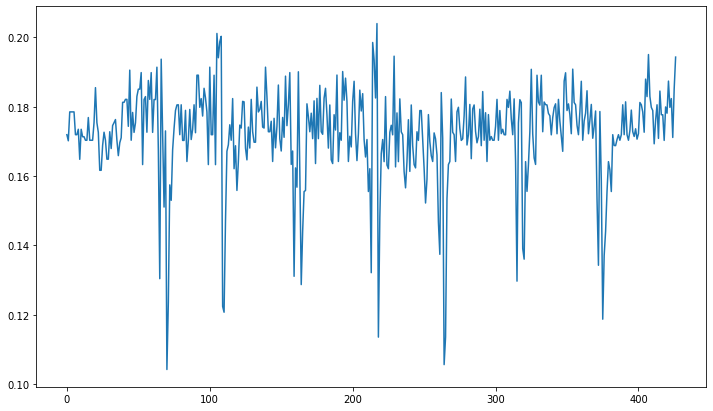

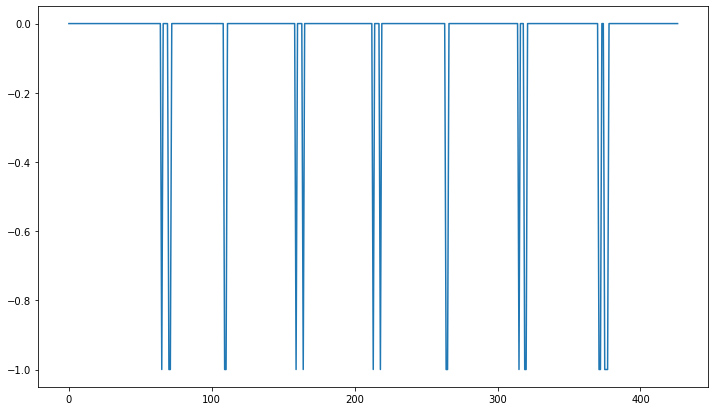

In [335]:
import numpy as np
import pylab
#Brakel, J.P.G. van (2014). "Robust peak detection algorithm using z-scores". Stack Overflow. Available at: https://stackoverflow.com/questions/22583391/peak-signal-detection-in-realtime-timeseries-data/22640362#22640362 (version: 2020-11-08).
def thresholding_algo(y, lag, threshold, influence):
    signals = np.zeros(len(y))
    filteredY = np.array(y)
    avgFilter = [0]*len(y)
    stdFilter = [0]*len(y)
    avgFilter[lag - 1] = np.mean(y[0:lag])
    stdFilter[lag - 1] = np.std(y[0:lag])
    for i in range(lag, len(y)):
        if abs(y[i] - avgFilter[i-1]) > threshold * stdFilter [i-1]:
            if y[i] > avgFilter[i-1]:
                signals[i] = 1
            else:
                signals[i] = -1

            filteredY[i] = influence * y[i] + (1 - influence) * filteredY[i-1]
            avgFilter[i] = np.mean(filteredY[(i-lag+1):i+1])
            stdFilter[i] = np.std(filteredY[(i-lag+1):i+1])
        else:
            signals[i] = 0
            filteredY[i] = y[i]
            avgFilter[i] = np.mean(filteredY[(i-lag+1):i+1])
            stdFilter[i] = np.std(filteredY[(i-lag+1):i+1])

    return dict(signals = np.asarray(signals),
                avgFilter = np.asarray(avgFilter),
                stdFilter = np.asarray(stdFilter))

out = thresholding_algo(ear_preds[1], 40, 4, 0)
plt.figure(figsize=(12,7))
plt.plot(ear_preds[1])
plt.show()
plt.figure(figsize=(12,7))
plt.plot(np.pad(out["signals"][40:],(40,0),constant_values=0))

plt.show()

[ 27  71 111 145 164 187 238 265 297 320 344 376 398]
[0.         0.         0.         0.         0.06269266 0.
 0.         0.         0.         0.04597876 0.         0.
 0.        ]


/tmp/ipykernel_5677/2144166655.py:13: PeakPropertyWarning: some peaks have a prominence of 0
  proms = peak_prominences(x, peaks)[0]


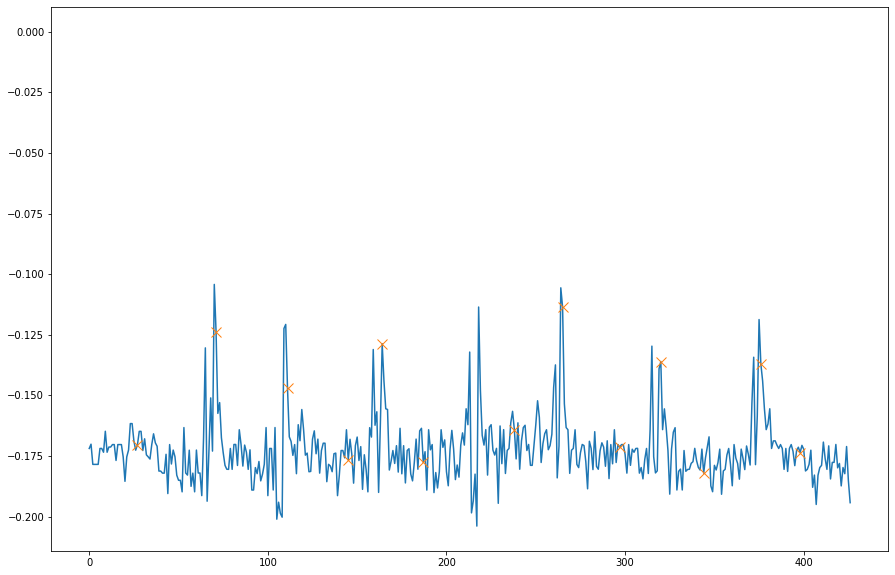

(0.0, 1.0)

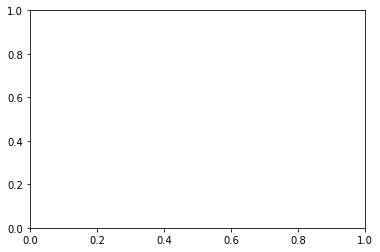

In [212]:
#test
from scipy.signal import find_peaks_cwt, peak_prominences

# for i in rtbene_preds.keys():
ear_preds = blink_analyse.get_preds(pred_path.EAR)

i=1
x = -1*ear_preds[i].to_numpy()

#threshold conf = 50% and distance between 2 consecutive blinks = 3 frames ~ 3*33 = 99ms since typical blink duration is btw 0.1 to 0.4 s (Ehinger battery paper)
peaks = find_peaks_cwt(x, np.arange(1,20)) #, height = -0.2, distance = 7)  #, prominence = 0.3) 
print(peaks)
proms = peak_prominences(x, peaks)[0]
print(proms)
plt.figure(figsize=(15,10))
plt.plot(x)
# plt.vlines(3,x.min(),x.max(), linestyles ='dashed', colors = 'orange')
plt.plot(peaks, x[peaks], "x", markersize = 10)
plt.plot(np.zeros_like([20]), "--", color="gray")
# plt.plot(np.zeros_like(rtbene_preds[1].to_numpy()), "--", color="gray")
plt.show()
plt.gca().get_ylim()

## EAR

mean int 49
LATENCY [26, 15, 14, 15, 13, 12, 14]
Recording Name :  blockNr_13_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  13.634000
RecStop - RecStart :  13632.0
Frame Count :  409
FPS :  29.998533079067037
start times :  [1432, 3396, 5109, 6633, 8281, 9814, 11340]
inter-beat duration :  [1964, 1713, 1524, 1648, 1533, 1526]
Latency:  [26, 15, 14, 15, 13, 12, 14]


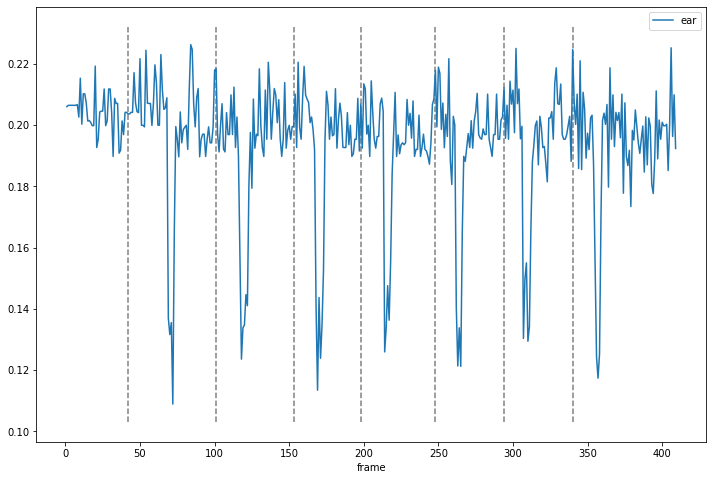

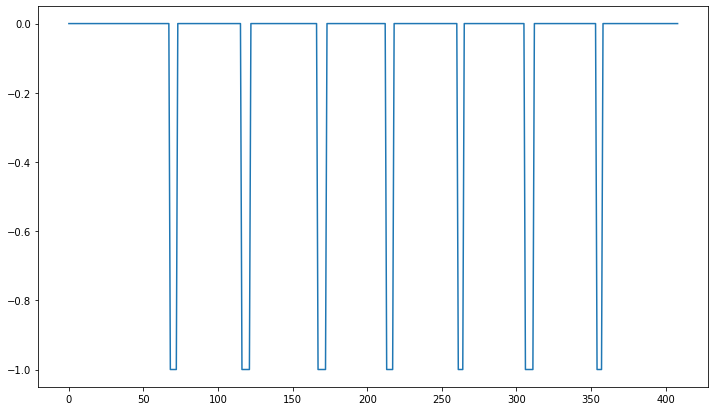

--------------------------------------------------
mean int 48
LATENCY [15, 13, 14, 13, 11, 15, 15]
Recording Name :  blockNr_13_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  13.436000
RecStop - RecStart :  13416.0
Frame Count :  403
FPS :  29.994045846978267
start times :  [1344, 2934, 4745, 6319, 7912, 9585, 11125]
inter-beat duration :  [1590, 1811, 1574, 1593, 1673, 1540]
Latency:  [15, 13, 14, 13, 11, 15, 15]


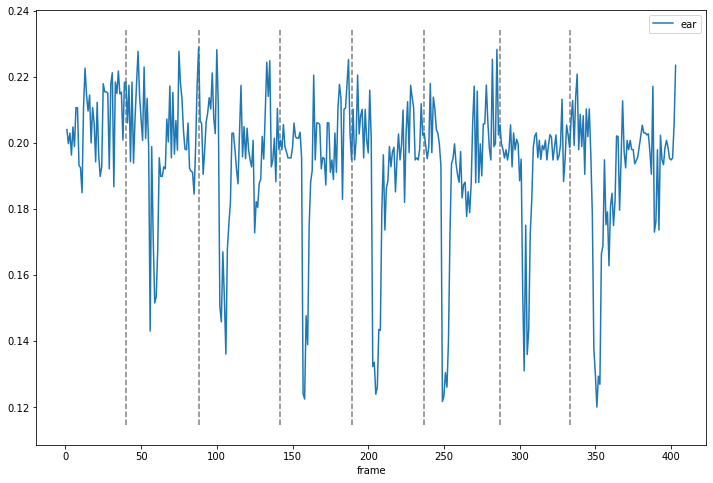

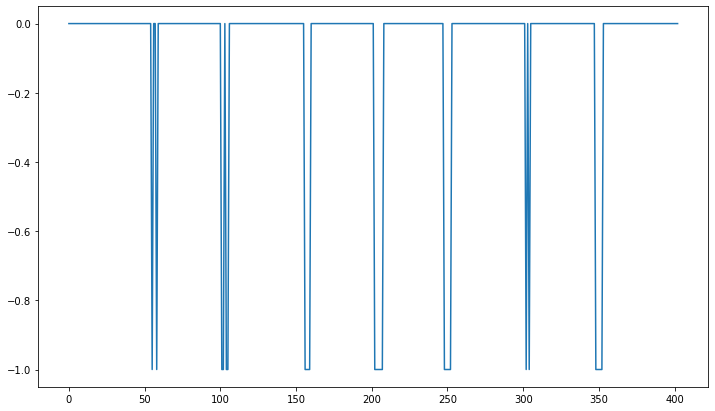

--------------------------------------------------
mean int 51
LATENCY [20, 14, 15, 15, 16, 15, 11]
Recording Name :  blockNr_13_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  13.867000
RecStop - RecStart :  13858.0
Frame Count :  416
FPS :  29.999278863488858
start times :  [1211, 2933, 4659, 6542, 8147, 9931, 11576]
inter-beat duration :  [1722, 1726, 1883, 1605, 1784, 1645]
Latency:  [20, 14, 15, 15, 16, 15, 11]


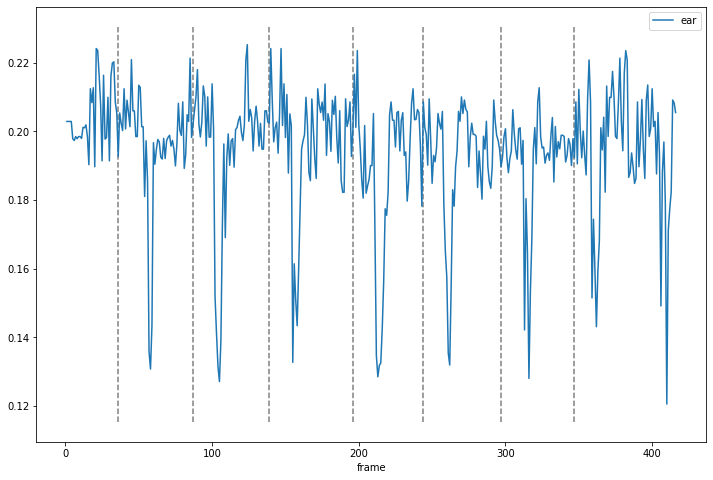

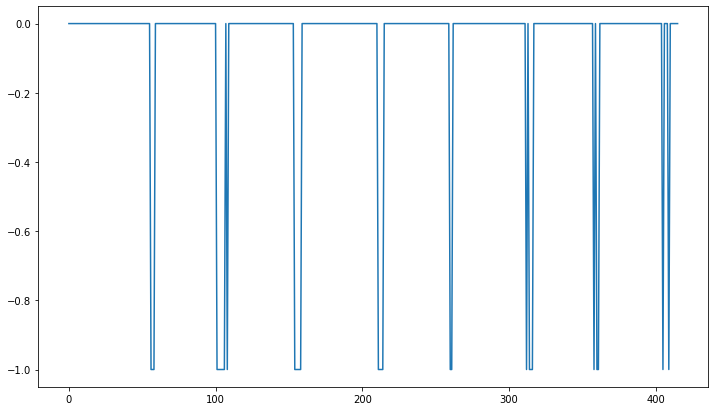

--------------------------------------------------
mean int 51
LATENCY [15, 14, 12, 13, 13, 15, 15]
Recording Name :  blockNr_13_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  13.975000
RecStop - RecStart :  13967.0
Frame Count :  419
FPS :  29.982110912343472
start times :  [1385, 2929, 4549, 6339, 8161, 9968, 11637]
inter-beat duration :  [1544, 1620, 1790, 1822, 1807, 1669]
Latency:  [15, 14, 12, 13, 13, 15, 15]


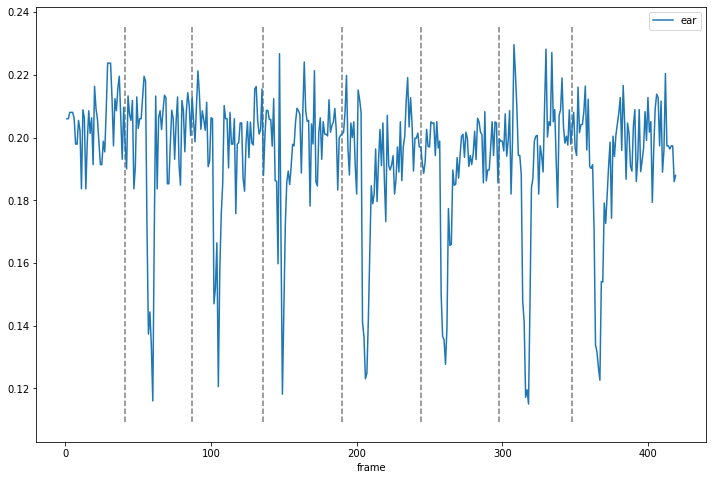

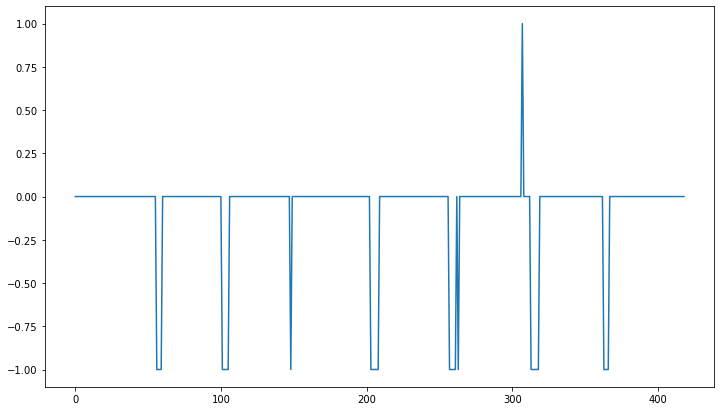

--------------------------------------------------
mean int 51
LATENCY [19, 16, 17, 18, 15, 16, 15]
Recording Name :  blockNr_13_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  14.222000
RecStop - RecStart :  14221.0
Frame Count :  427
FPS :  30.023906623540995
start times :  [1558, 3115, 4922, 6566, 8457, 10315, 11912]
inter-beat duration :  [1557, 1807, 1644, 1891, 1858, 1597]
Latency:  [19, 16, 17, 18, 15, 16, 15]


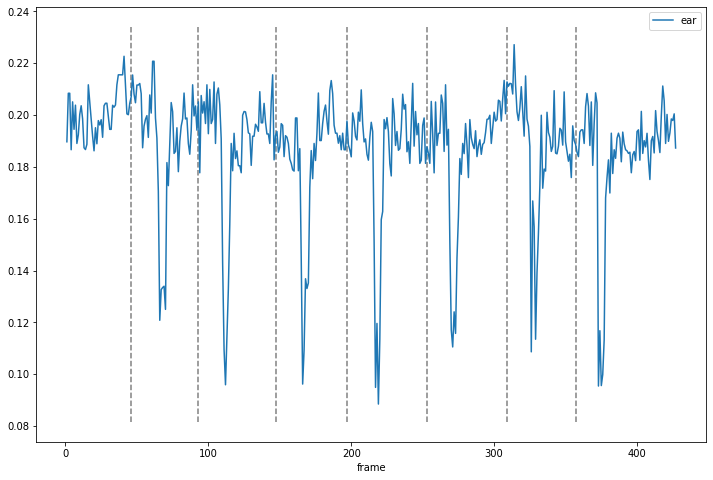

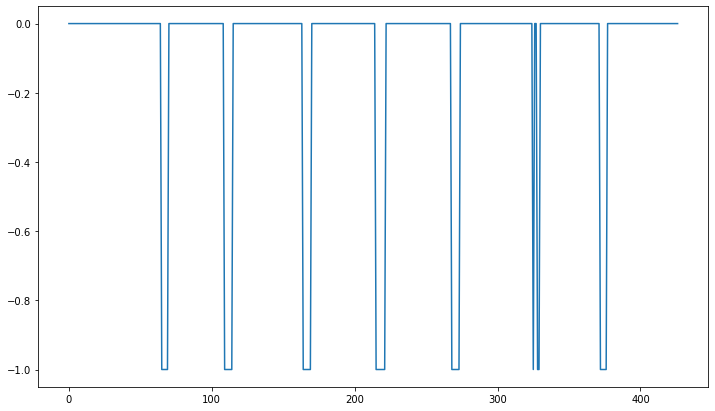

--------------------------------------------------
mean int 49
LATENCY [19, 18, 12, 13, 10, 16, 16]
Recording Name :  blockNr_6_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  13.560000
RecStop - RecStart :  13559.0
Frame Count :  407
FPS :  30.01474926253687
start times :  [1443, 3011, 4515, 6003, 7654, 9453, 11239]
inter-beat duration :  [1568, 1504, 1488, 1651, 1799, 1786]
Latency:  [19, 18, 12, 13, 10, 16, 16]


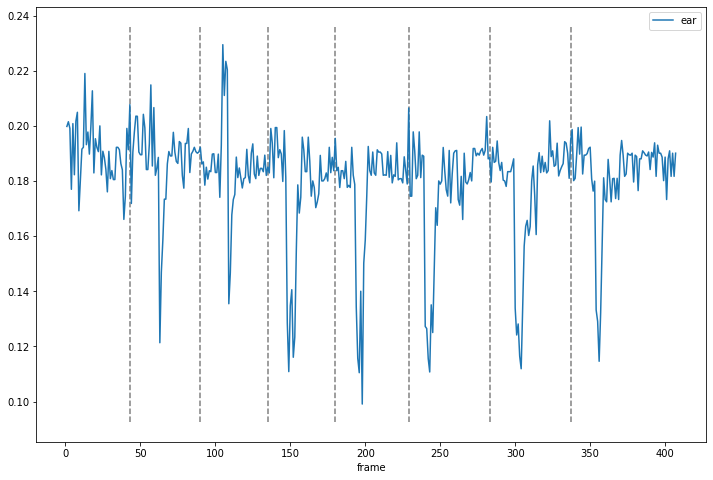

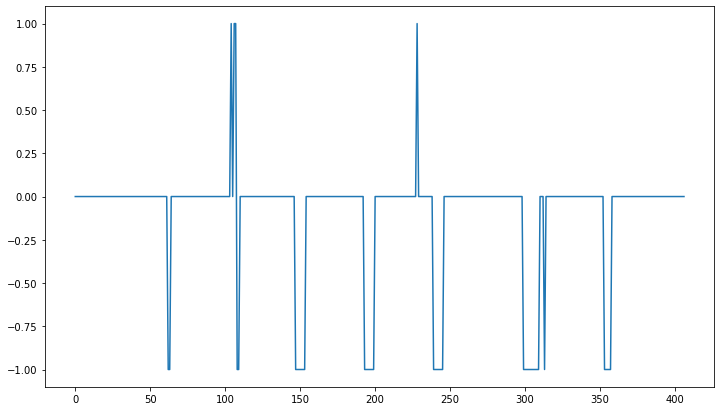

--------------------------------------------------
mean int 52
LATENCY [4, 19, 14, 15, 19, 17, nan]
Recording Name :  blockNr_6_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  14.025000
RecStop - RecStart :  14043.0
Frame Count :  420
FPS :  29.946524064171122
start times :  [1297, 2832, 4714, 6578, 8251, 9938, 11731]
inter-beat duration :  [1535, 1882, 1864, 1673, 1687, 1793]
Latency:  [4, 19, 14, 15, 19, 17, nan]


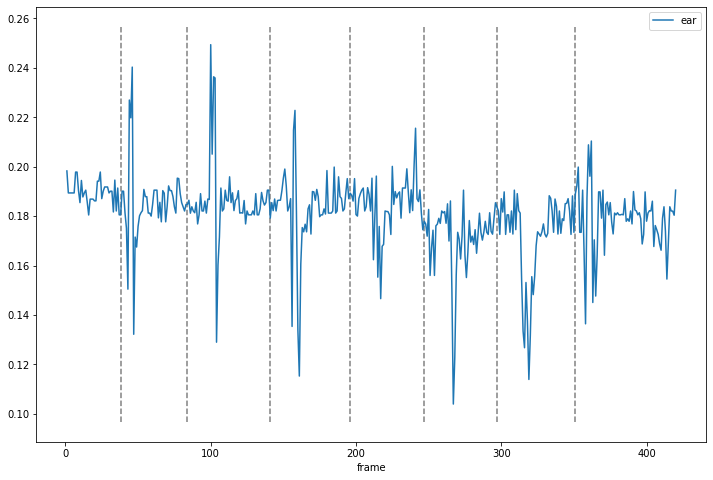

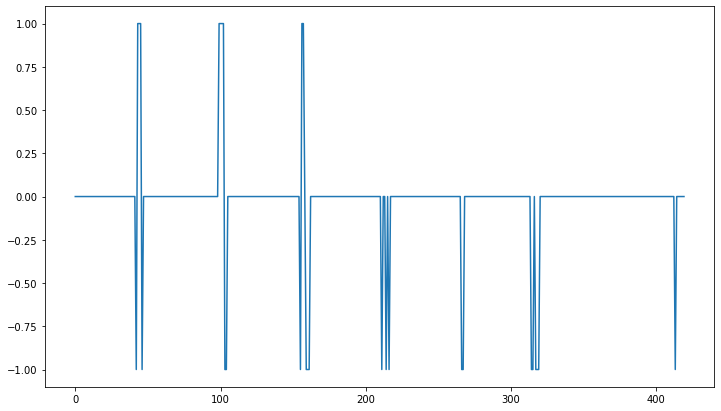

--------------------------------------------------
mean int 52
LATENCY [23, 20, 14, 15, 18, 14, 14]
Recording Name :  blockNr_6_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  14.233000
RecStop - RecStart :  14238.0
Frame Count :  427
FPS :  30.00070259256657
start times :  [1418, 2993, 4841, 6617, 8221, 10037, 11914]
inter-beat duration :  [1575, 1848, 1776, 1604, 1816, 1877]
Latency:  [23, 20, 14, 15, 18, 14, 14]


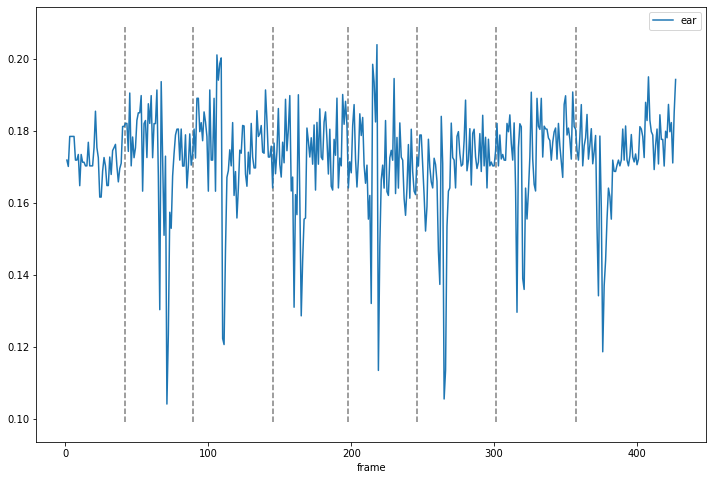

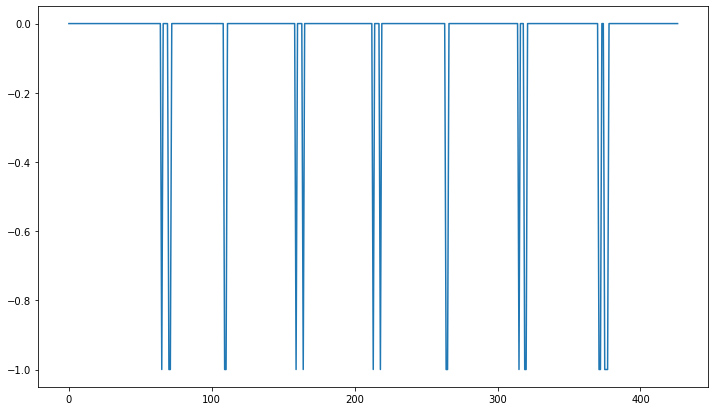

--------------------------------------------------
mean int 54
LATENCY [15, 10, nan, 14, 12, 14, 14]
Recording Name :  blockNr_6_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  14.518000
RecStop - RecStart :  14522.0
Frame Count :  435
FPS :  29.962804794048765
start times :  [1357, 3073, 4831, 6660, 8595, 10408, 12190]
inter-beat duration :  [1716, 1758, 1829, 1935, 1813, 1782]
Latency:  [15, 10, nan, 14, 12, 14, 14]


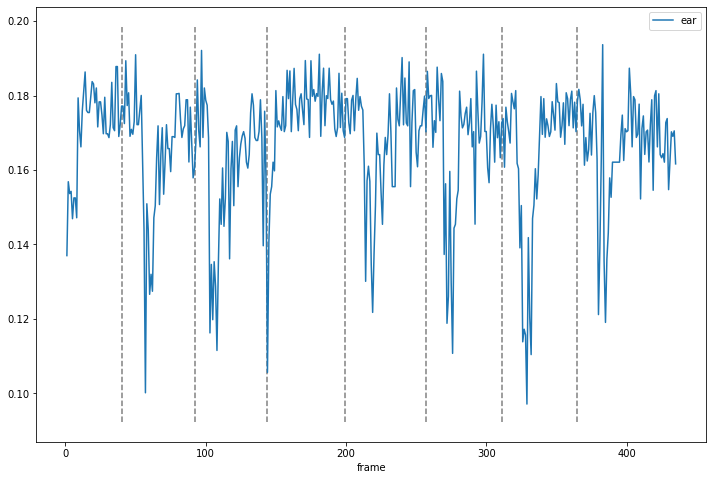

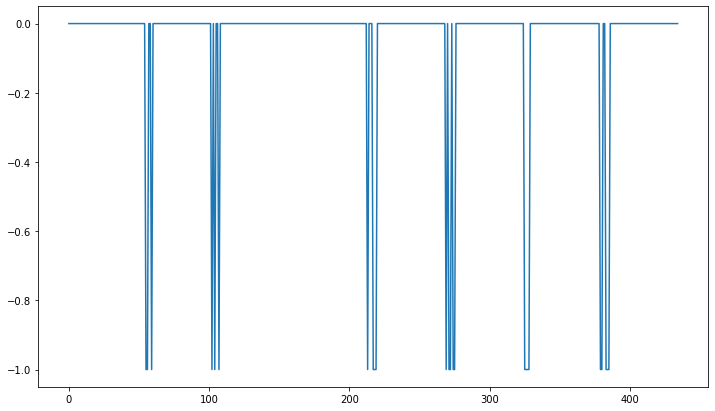

--------------------------------------------------
mean int 51
LATENCY [24, 18, 14, nan, nan, nan, nan]
Recording Name :  blockNr_6_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  14.253000
RecStop - RecStart :  14237.0
Frame Count :  427
FPS :  29.95860520592156
start times :  [1593, 3149, 4957, 6789, 8655, 10210, 11910]
inter-beat duration :  [1556, 1808, 1832, 1866, 1555, 1700]
Latency:  [24, 18, 14, nan, nan, nan, nan]


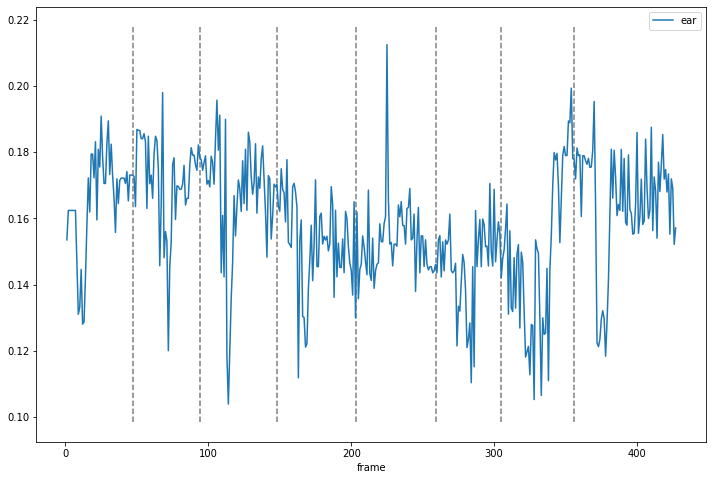

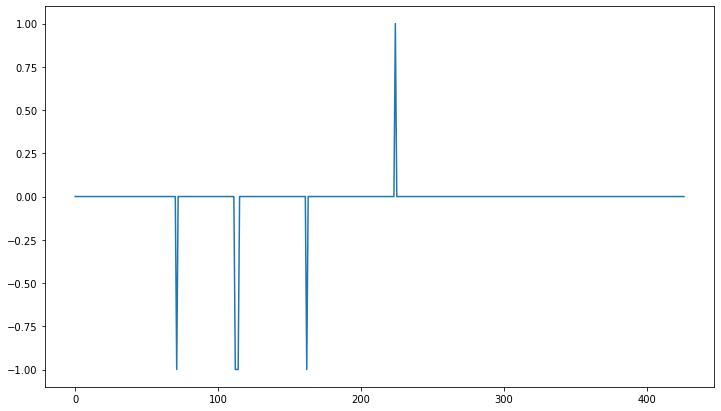

--------------------------------------------------


In [679]:
ear_preds = blink_analyse.parse_trials_stack(pred_path.EAR)

In [670]:
ear_preds.keys() #trials

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])

15.140625

In [724]:
lengths = [len(t[~np.isnan(t)]) for t in ear_preds.values()]
print(f"number of blinks detected in each trial: {lengths}")
print("Avg blinks/trial: ",statistics.mean(lengths))
t = np.concatenate(list(ear_preds.values()))
print("Avg latency: ",np.mean(t[~np.isnan(t)])/0.030)

number of blinks detected in each trial: [7, 7, 6, 3, 6, 7, 7, 7, 7, 7]
Avg blinks/trial:  6.4
Avg latency:  504.6875


In [262]:
l = [len(i) for i in ear_preds.values()]
sum(l)/len(l)

9.2

## RT-Bene

median: 0.0093841552734375
Recording Name :  blockNr_13_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  13.634000
RecStop - RecStart :  13632.0
Frame Count :  409
FPS :  29.998533079067037
start times :  [1432, 3396, 5109, 6633, 8281, 9814, 11340]
stop times :  [1963, 3710, 5423, 6920, 8588, 10086, 11621]
diff :  [1432, 1433, 1399, 1210, 1361, 1226, 1254]


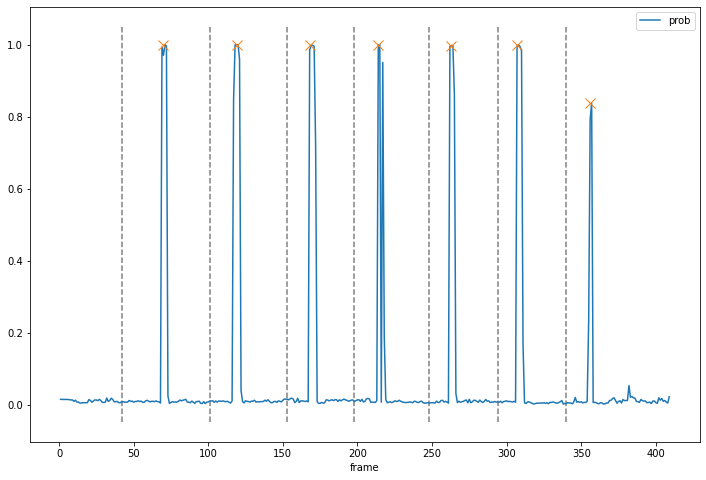

--------------------------------------------------
median: 0.010736403055489
Recording Name :  blockNr_13_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  13.436000
RecStop - RecStart :  13416.0
Frame Count :  403
FPS :  29.994045846978267
start times :  [1344, 2934, 4745, 6319, 7912, 9585, 11125]
stop times :  [1649, 3214, 5042, 6587, 8195, 9880, 11413]
diff :  [1344, 1285, 1531, 1277, 1325, 1390, 1245]


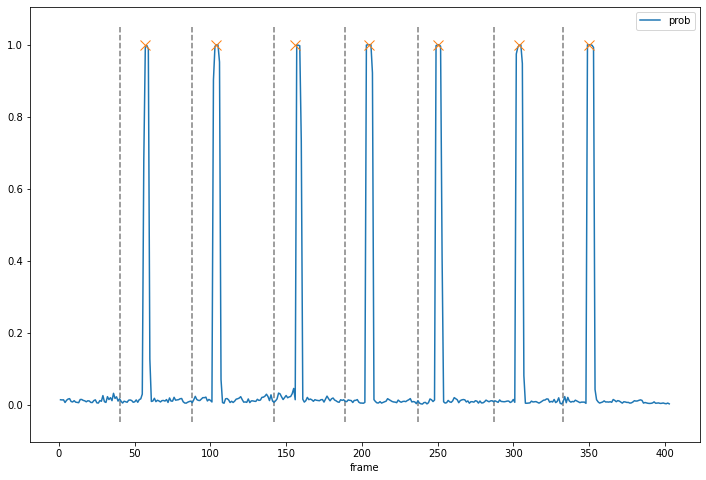

--------------------------------------------------
median: 0.01223815046250815
Recording Name :  blockNr_13_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  13.867000
RecStop - RecStart :  13858.0
Frame Count :  416
FPS :  29.999278863488858
start times :  [1211, 2933, 4659, 6542, 8147, 9931, 11576]
stop times :  [1496, 3258, 4956, 6841, 8436, 10239, 11851]
diff :  [1211, 1437, 1401, 1586, 1306, 1495, 1337]


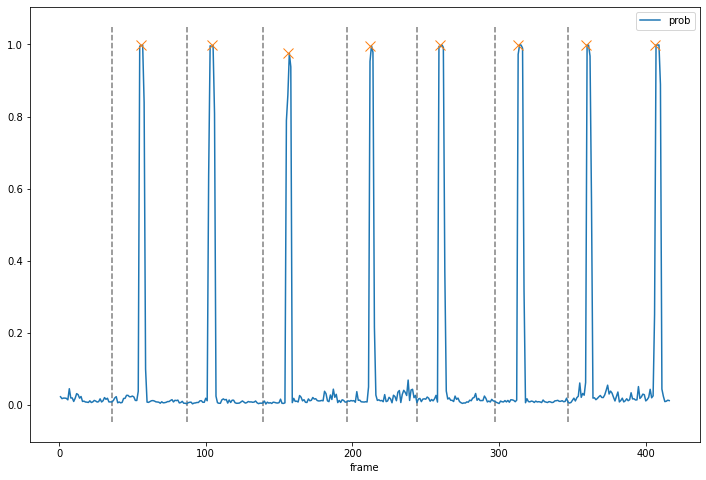

--------------------------------------------------
median: 0.0103703048080205
Recording Name :  blockNr_13_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  13.975000
RecStop - RecStart :  13967.0
Frame Count :  419
FPS :  29.982110912343472
start times :  [1385, 2929, 4549, 6339, 8161, 9968, 11637]
stop times :  [1701, 3214, 4873, 6654, 8483, 10271, 11962]
diff :  [1385, 1228, 1335, 1466, 1507, 1485, 1366]


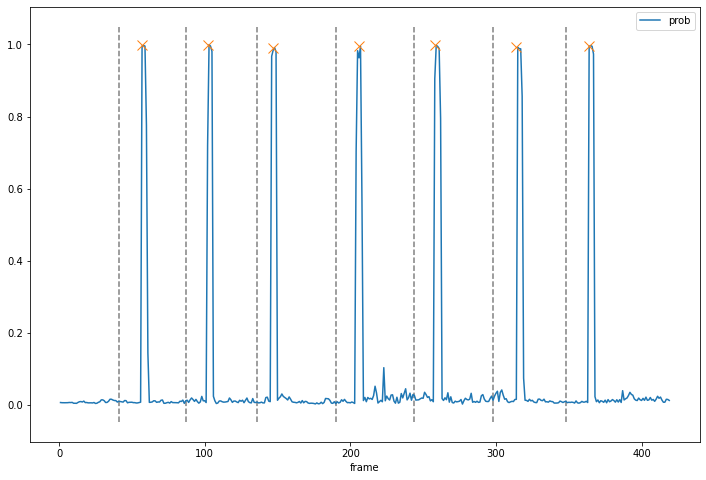

--------------------------------------------------
median: 0.0138923935592174
Recording Name :  blockNr_13_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  14.222000
RecStop - RecStart :  14221.0
Frame Count :  427
FPS :  30.023906623540995
start times :  [1558, 3115, 4922, 6566, 8457, 10315, 11912]
stop times :  [1869, 3407, 5247, 6849, 8789, 10635, 12211]
diff :  [1558, 1246, 1515, 1319, 1608, 1526, 1277]


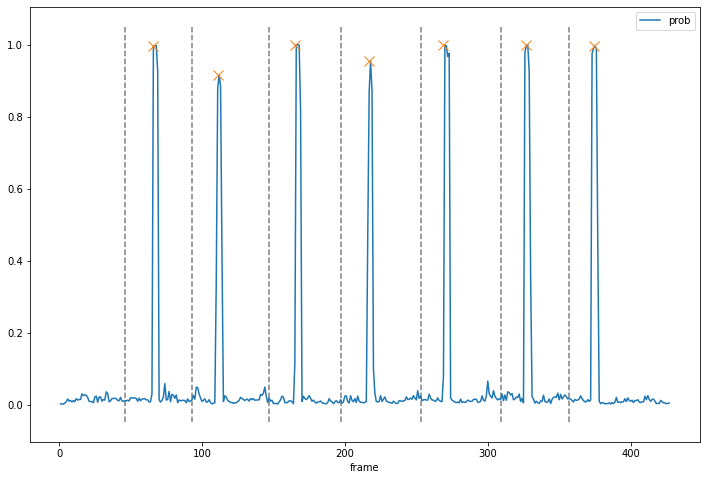

--------------------------------------------------
median: 0.0150578618049621
Recording Name :  blockNr_6_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  13.560000
RecStop - RecStart :  13559.0
Frame Count :  407
FPS :  30.01474926253687
start times :  [1443, 3011, 4515, 6003, 7654, 9453, 11239]
stop times :  [1744, 3289, 4785, 6285, 7964, 9767, 11546]
diff :  [1443, 1267, 1226, 1218, 1369, 1489, 1472]


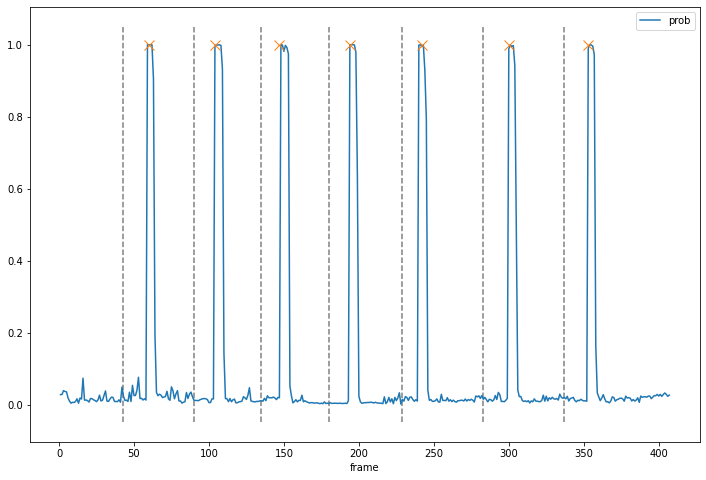

--------------------------------------------------
median: 0.01877428684383625
Recording Name :  blockNr_6_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  14.025000
RecStop - RecStart :  14043.0
Frame Count :  420
FPS :  29.946524064171122
start times :  [1297, 2832, 4714, 6578, 8251, 9938, 11731]
stop times :  [1563, 3110, 5032, 6888, 8565, 10254, 12041]
diff :  [1297, 1269, 1604, 1546, 1363, 1373, 1477]


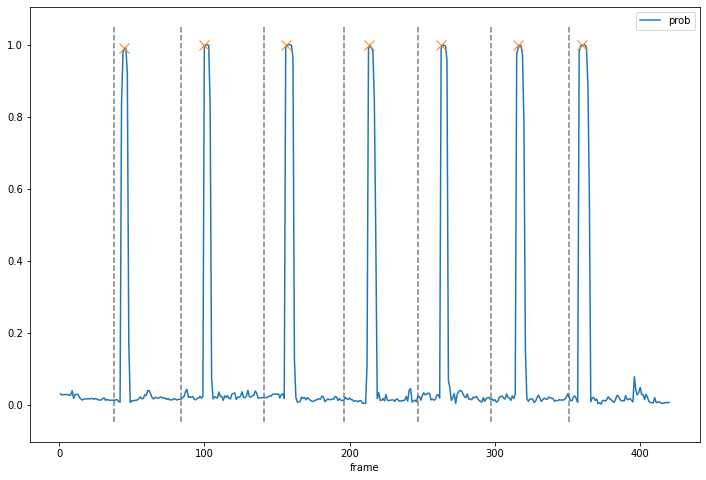

--------------------------------------------------
median: 0.0126215368509292
Recording Name :  blockNr_6_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  14.233000
RecStop - RecStart :  14238.0
Frame Count :  427
FPS :  30.00070259256657
start times :  [1418, 2993, 4841, 6617, 8221, 10037, 11914]
stop times :  [1723, 3277, 5157, 6935, 8506, 10354, 12225]
diff :  [1418, 1270, 1564, 1460, 1286, 1531, 1560]


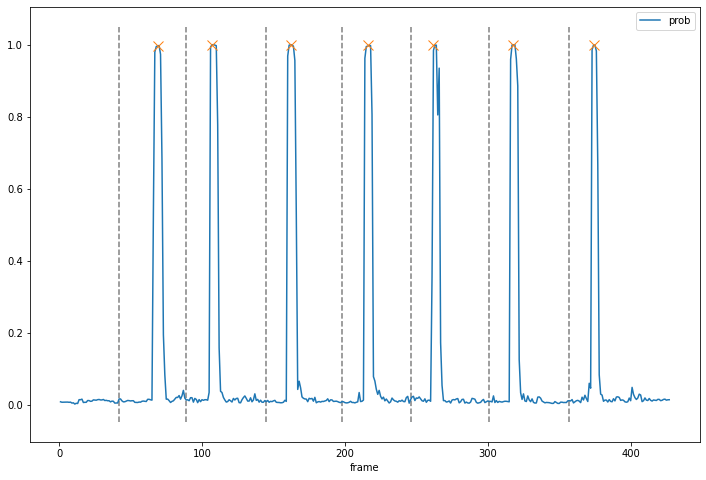

--------------------------------------------------
median: 0.0144587261602282
Recording Name :  blockNr_6_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  14.518000
RecStop - RecStart :  14522.0
Frame Count :  435
FPS :  29.962804794048765
start times :  [1357, 3073, 4831, 6660, 8595, 10408, 12190]
stop times :  [1672, 3391, 5146, 6984, 8910, 10724, 12507]
diff :  [1357, 1401, 1440, 1514, 1611, 1498, 1466]


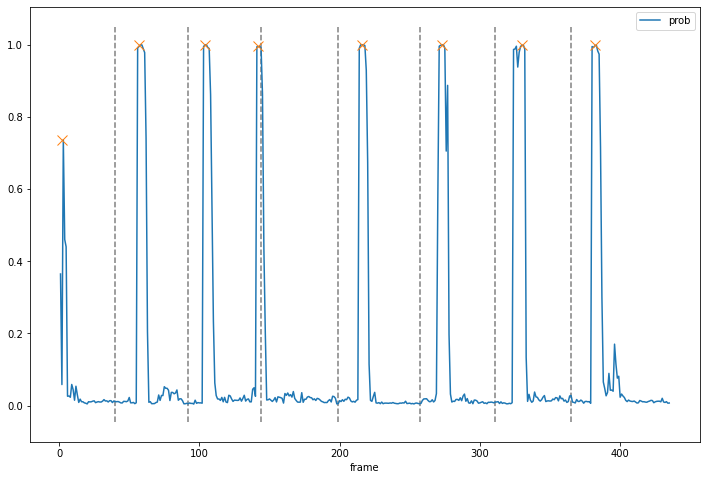

--------------------------------------------------
median: 0.0199542865157127
Recording Name :  blockNr_6_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  14.253000
RecStop - RecStart :  14237.0
Frame Count :  427
FPS :  29.95860520592156
start times :  [1593, 3149, 4957, 6789, 8655, 10210, 11910]
stop times :  [1895, 3447, 5282, 7098, 8974, 10479, 12226]
diff :  [1593, 1254, 1510, 1507, 1557, 1236, 1431]


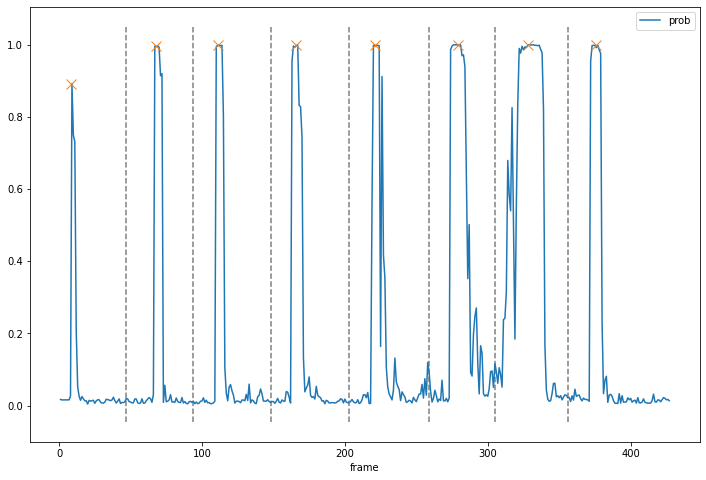

--------------------------------------------------


In [357]:
rtbene_preds = blink_analyse.parse_trials(pred_path.RT_BENE)

In [321]:
l = [len(i) for i in rtbene_preds.values()]
sum(l)/len(l)

9.0

In [279]:
del temp